In [2]:
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

# Load JSON data
gini_filepath = '../results/weighted_gini_components_by_ind_18plus_1976plus.json'
with open(gini_filepath) as f:
    gini_data = json.load(f)

stats_filepath = '../results/income_statistics_26to65_1976plus_ftfy_winsorized.json'
with open(stats_filepath) as f:
    stats_data = json.load(f)

stats_filepath_unfiltered = '../results/income_statistics_26to65_1976plus_ftfy.json'
with open(stats_filepath) as f:
    stats_data_unfiltered = json.load(f)


In [2]:
swap_df = pd.read_csv(f'./data/swapvalues_1976-2010.csv')

In [8]:
def process_swap_data(swap_df):
    """Clean and filter swap data for relevant years."""
    swap_df = swap_df.fillna(0)
    swap_df.columns = swap_df.columns.str.upper()   # capitalize to match cps data columns
    return swap_df[swap_df['YEAR'] >= 2000]

def merge_cps_with_swap_data(cps_df, swap_df):
    """Merge CPS data with swap data."""
    merged = pd.merge(cps_df, swap_df, on=['YEAR', 'SERIAL', 'PERNUM'], how='left', indicator=True)
    merged['swap'] = merged['_merge'] == 'both'
    return merged.drop('_merge', axis=1)

In [41]:
swap_df = process_swap_data(swap_df)

In [92]:
swap_df.duplicated().sum()

0

In [39]:
merged = pd.merge(df_2000, swap_df, on=['YEAR', 'SERIAL', 'PERNUM'], how='left', indicator=True)

NameError: name 'df_2000' is not defined

In [43]:
merged['swap'] = merged['_merge'] == 'both'

In [ ]:
df_2000

In [44]:
merged = merged.drop('_merge', axis=1)

In [38]:
col='INCLONGJ'
mask = (merged[f'{col}_SWAP'].notna() & (merged[f'{col}_SWAP'] != 0) & conditions[period])
merged.loc[mask, col] = merged[f'{col}_SWAP']

NameError: name 'merged' is not defined

In [29]:
[col for col in merged.columns]

['YEAR',
 'SERIAL',
 'MONTH',
 'CPSID',
 'ASECFLAG',
 'HFLAG',
 'ASECWTH',
 'CPI99',
 'REGION',
 'STATEFIP',
 'HHINCOME',
 'PERNUM',
 'CPSIDV',
 'CPSIDP',
 'ASECWT',
 'AGE',
 'SEX',
 'RACE',
 'MARST',
 'EMPSTAT',
 'OCC',
 'OCC1950',
 'IND',
 'IND1950',
 'EDUC',
 'WKSWORK1',
 'UHRSWORKLY',
 'FTOTVAL',
 'INCTOT',
 'INCWAGE',
 'INCBUS',
 'INCFARM',
 'INCSS',
 'INCWELFR',
 'INCGOV',
 'INCALOTH',
 'INCRETIR',
 'INCSSI',
 'INCDRT',
 'INCINT',
 'INCUNEMP',
 'INCWKCOM',
 'INCVET',
 'INCSURV',
 'INCDISAB',
 'INCDIVID',
 'INCRENT',
 'INCEDUC',
 'INCCHILD',
 'INCALIM',
 'INCASIST',
 'INCOTHER',
 'INCRANN',
 'INCPENS',
 'INCLONGJ',
 'OINCBUS',
 'OINCFARM',
 'OINCWAGE',
 'SRCRETI1',
 'SRCRETI2',
 'INCRETI1',
 'INCRETI2',
 'SRCSURV1',
 'SRCSURV2',
 'INCSURV1',
 'INCSURV2',
 'INCDISA1',
 'INCDISA2',
 'INCRET1',
 'INCRET2',
 'INCPEN1',
 'INCPEN2',
 'INCRINT1',
 'INCRINT2',
 'INCCAPG',
 'SRCEARN',
 'INCLONGJ_RAW',
 'INCWAGE_SWAP_x',
 'INCBUS_SWAP_x',
 'INCFARM_SWAP_x',
 'INCSS_SWAP_x',
 'INCWELFR_SWAP_

In [49]:
swap_yearly = swap_df.groupby('year')['inclongj_swap'].mean().reset_index()

# INCLONGJ_SWAP is fine but processed INCLONGJ is weird
# plot distribution of INCLONGJ for different years
# check the swapping process somehow?

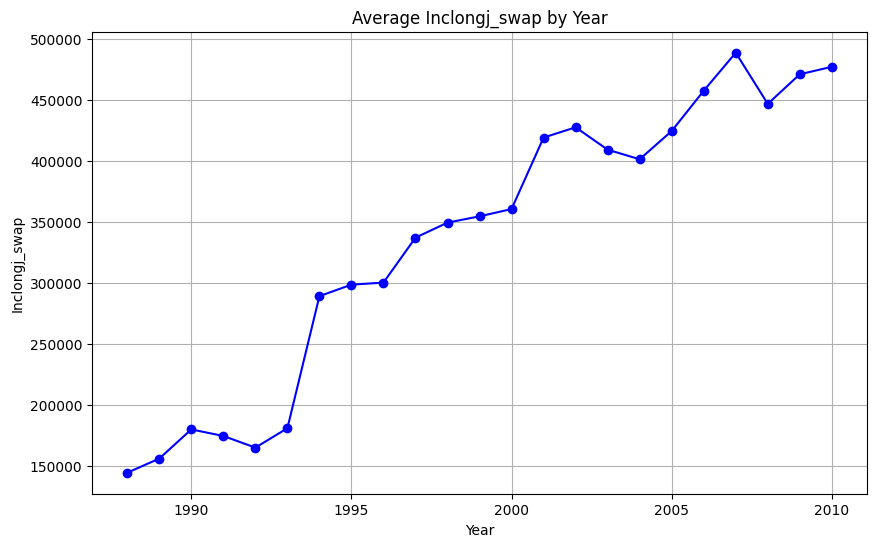

In [50]:
plt.figure(figsize=(10, 6))
plt.plot(swap_yearly['year'], swap_yearly['inclongj_swap'], marker='o', linestyle='-', color='b')
plt.title('Average Inclongj_swap by Year')
plt.xlabel('Year')
plt.ylabel('Inclongj_swap')
plt.grid(True)
# plt.xticks(swap_yearly['year'].unique())  # To display all years on the x-axis
plt.show()

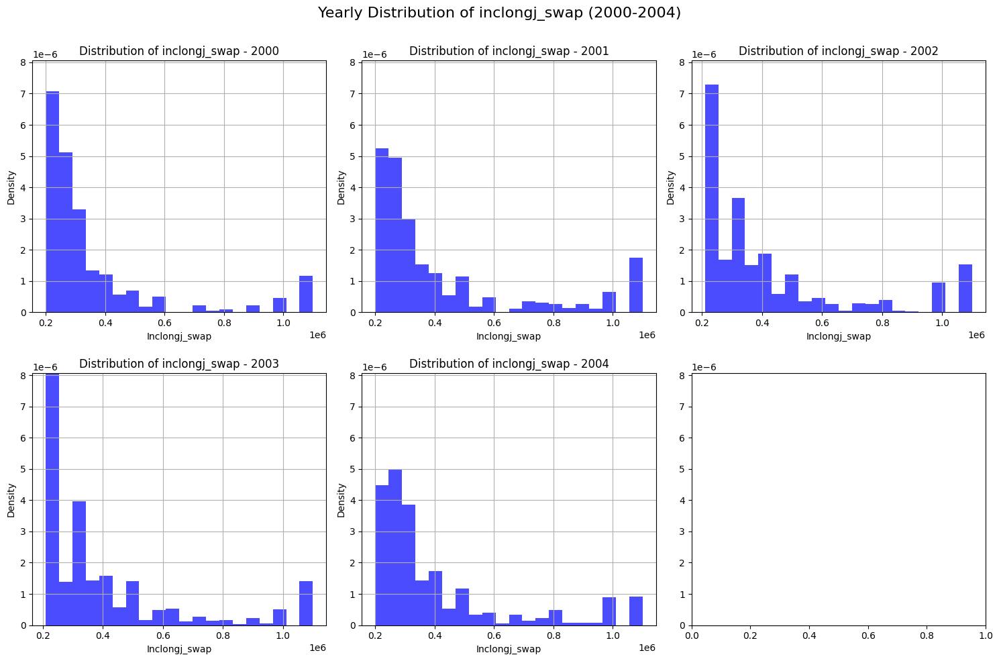

In [52]:
# Filter data for years 2000-2004
df_filtered = swap_df[swap_df['year'].between(2000, 2004)]

# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Initialize a list to store the maximum y-values for each histogram
y_max_values = []

# Plot histograms for each year (2000-2004)
for i, year in enumerate(range(2000, 2005)):
    ax = axes[i]
    data_year = df_filtered[df_filtered['year'] == year]
    # Plot histogram and get the max y-value
    n, bins, patches = ax.hist(data_year['inclongj_swap'], bins=20, color='blue', alpha=0.7, density=True)
    y_max_values.append(n.max())  # Add the maximum y-value to the list
    ax.set_title(f'Distribution of inclongj_swap - {year}')
    ax.set_xlabel('Inclongj_swap')
    ax.set_ylabel('Density')
    ax.grid(True)

# Find the global max y-value across all histograms
y_max = max(y_max_values)

# Set the same y-axis limit for all plots
for ax in axes:
    ax.set_ylim(0, y_max)

# Adjust layout for better spacing
plt.tight_layout()
plt.suptitle('Yearly Distribution of inclongj_swap (2000-2004)', fontsize=16)
plt.subplots_adjust(top=0.9)  # Adjust the title position

# Show the plot
plt.show()

In [52]:
def flag_top_1_percent(df):
    """Flag top 1% of income earners based on labor and capital income."""
    
    # Make a copy of the DataFrame to avoid modifying the original
    df_copy = df.copy()
    
    # You can use this mask if you intend to filter full-time, full-year employees
    ftfy_mask = df_copy['is_full_time_full_year']
    df_copy = df_copy[ftfy_mask]  # Apply the filter if necessary
    
    # Iterate over both 'labor_income' and 'capital_income'
    for col in ['labor_income', 'capital_income']:
        thresholds = (
            df_copy.groupby(['income_year', 'SEX'])[col]
            .quantile(0.99)
            .rename(f'{col}_99_2')
        )
        # Merge the thresholds into the DataFrame copy
        df_copy = df_copy.merge(thresholds, on=['income_year', 'SEX'], how='left')
    
    # Flag for the top 1% based on both income columns' 99th percentile thresholds
    df_copy['winsor99'] = (
        (df_copy['labor_income'] <= df_copy['labor_income_99_2']) & 
        (df_copy['capital_income'] <= df_copy['capital_income_99_2'])
    )
    
    # Return only the 'winsor99' column as a series (without modifying original DataFrame)
    return df_copy

In [5]:
# ISOLATE SWAP

def apply_inclongj_swap(df, swap_df):
    """
    Merges the main dataframe with swap values for INCLONGJ and updates the column INCLONG_RAW.
    
    Parameters:
        df (pd.DataFrame): Main dataframe containing columns YEAR, SERIAL, PERNUM, and INCLONG_RAW.
        swap_file_path (str): Path to the swap file.
    
    Returns:
        pd.DataFrame: Updated dataframe with INCLONG_RAW replaced by INCLONGJ_SWAP where applicable.
    """
    # Load the swap data
    swap_data = swap_df
    
    # Ensure column names in swap_data match the capitalized names in df
    swap_data.rename(columns={
        'year': 'YEAR',
        'serial': 'SERIAL',
        'pernum': 'PERNUM',
        'inclongj_swap': 'INCLONGJ_SWAP'
    }, inplace=True)
    
    # Merge the dataframes on YEAR, SERIAL, and PERNUM
    merged_df = pd.merge(
        df, 
        swap_data[['YEAR', 'SERIAL', 'PERNUM', 'INCLONGJ_SWAP']], 
        on=['YEAR', 'SERIAL', 'PERNUM'], 
        how='left',
        suffixes=('', '_SWAPTEST')
    )
    
    # Replace INCLONG_RAW with the swapped value if available
    merged_df['INCLONGJ_1_RAW_SWAPPED'] = merged_df['INCLONGJ_SWAP_SWAPTEST'].combine_first(merged_df['INCLONGJ_1_RAW'])
    
    # Drop the extra INCLONGJ_SWAP_SWAP column if no longer needed
    merged_df.drop(columns=['INCLONGJ_SWAP_SWAPTEST'], inplace=True)
    
    return merged_df


In [6]:
def apply_and_save_inclongj_swaps():
    years = range(1994, 2024)
    for year in years:
        print(year)
        year_df = pd.read_csv(f'./data/cps_data/{year}_sample.csv')
        swapped_df = apply_inclongj_swap(year_df, swap_df)
        swapped_df.to_csv(f'./data/cps_data/{year}_sample.csv')

apply_and_save_inclongj_swaps()

1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023


In [7]:
def plot_variable_statistics(variable, years, sex, data_path='./data/cps_data/', 
                             trim_data=False, use_weights=True, save_dir='./figures/'):
    """
    Plots statistics (max, min, mean, median, standard deviation, 99th percentile) 
    for a specified variable and subset of the data based on the sex parameter. 
    Supports weighted calculations for mean, median, and standard deviation using ASECWT.
    The 99th percentile remains unweighted.

    Parameters:
        variable (str): The column name of the variable to analyze.
        years (iterable): Years to analyze.
        sex (int): 1 for males, 2 for females.
        data_path (str): Path to the directory containing the yearly data files.
        trim_data (bool, optional): If True, uses the 'winsor99' column for trimming.
        use_weights (bool, optional): If True, calculates weighted statistics using 'ASECWT'.
        save_dir (str): Directory where the plot will be saved.
    """
    # Initialize lists to store the results
    max_values = []
    min_values = []
    mean_values = []
    median_values = []
    std_dev_values = []
    percentile_99 = []

    # Determine the sex label
    sex_label = "Male" if sex == 1 else "Female"

    # Loop through each year
    for year in years:
        # Load the data
        year_data = pd.read_csv(f'{data_path}/{year}_sample.csv')
        
        # Filter the data for full-time, full-year workers and specified sex
        subset = year_data[year_data['is_full_time_full_year'] & (year_data['SEX'] == sex)]
        if trim_data:
            subset = subset[subset['winsor99']]
        
        # Check if weights should be used
        if use_weights and 'ASECWT' in subset.columns:
            weights = subset['ASECWT'].values
            values = subset[variable].values
            mean_val = np.average(values, weights=weights)
            std_dev = np.sqrt(np.average((values - mean_val)**2, weights=weights))
            
            # Weighted median
            sorted_indices = np.argsort(values)
            sorted_values = values[sorted_indices]
            sorted_weights = weights[sorted_indices]
            cumulative_weights = np.cumsum(sorted_weights)
            total_weight = cumulative_weights[-1]
            median_val = sorted_values[np.searchsorted(cumulative_weights, total_weight / 2)]

        else:
            # Calculate unweighted statistics
            values = subset[variable]
            mean_val = values.mean()
            std_dev = values.std(ddof=1)
            median_val = values.median()

        # Percentile remains unweighted
        p99 = np.percentile(subset[variable], 99)

        max_val = subset[variable].max()
        min_val = subset[variable].min()

        # Append results to the respective lists
        max_values.append(max_val)
        min_values.append(min_val)
        mean_values.append(mean_val)
        median_values.append(median_val)
        std_dev_values.append(std_dev)
        percentile_99.append(p99)


    # Plot the results
    fig, ax = plt.subplots(3, 2, figsize=(14, 18))  # 3 rows, 2 columns for subplots
    ax = ax.flatten()  # Flatten the axes array for easier indexing

    # Create more descriptive titles based on the selected variable
    var_title = variable.replace("_", " ").capitalize()
    trim_text = " (Trimmed Top 1% LI)" if trim_data else ""
    subtitle = f"{sex_label} Workers{trim_text}"

    # Plot max values
    ax[0].plot(years, max_values, marker='o', label='Max Value', color='blue')
    ax[0].set_title(f'Maximum {var_title} by Year: {subtitle}')
    ax[0].set_xlabel('Year')
    ax[0].set_ylabel(var_title)
    ax[0].grid(True)

    # Plot min values
    ax[1].plot(years, min_values, marker='o', label='Min Value', color='red')
    ax[1].set_title(f'Minimum {var_title} by Year: {subtitle}')
    ax[1].set_xlabel('Year')
    ax[1].set_ylabel(var_title)
    ax[1].grid(True)

    # Plot mean values
    ax[2].plot(years, mean_values, marker='o', label='Mean', color='green')
    ax[2].set_title(f'Mean {var_title} by Year: {subtitle}')
    ax[2].set_xlabel('Year')
    ax[2].set_ylabel(var_title)
    ax[2].grid(True)

    # Plot median values
    ax[3].plot(years, median_values, marker='o', label='Median', color='brown')
    ax[3].set_title(f'Median {var_title} by Year: {subtitle}')
    ax[3].set_xlabel('Year')
    ax[3].set_ylabel(var_title)
    ax[3].grid(True)

    # Plot standard deviation values
    ax[4].plot(years, std_dev_values, marker='o', label='Standard Deviation', color='purple')
    ax[4].set_title(f'Standard Deviation of {var_title} by Year: {subtitle}')
    ax[4].set_xlabel('Year')
    ax[4].set_ylabel(var_title)
    ax[4].grid(True)

    # Plot 99th percentile values
    ax[5].plot(years, percentile_99, marker='o', label='99th Percentile', color='orange')
    ax[5].set_title(f'99th Percentile of {var_title} by Year: {subtitle}')
    ax[5].set_xlabel('Year')
    ax[5].set_ylabel(var_title)
    ax[5].grid(True)

    # Add legends to all plots
    for axis in ax:
        axis.legend()

    # Adjust layout
    fig.tight_layout()

    # Ensure the save directory exists
    os.makedirs(save_dir, exist_ok=True)

    # Generate a descriptive filename
    trim_suffix = "_trimmed" if trim_data else ""
    filename = f"{variable}_{sex_label}_statistics{trim_suffix}.png".replace(" ", "_")
    save_path = os.path.join(save_dir, filename)

    # Save the figure
    plt.savefig(save_path)
    print(f"Figure saved to: {save_path}")

    plt.show()


Figure saved to: ./figures/log_labor_income_Male_statistics.png


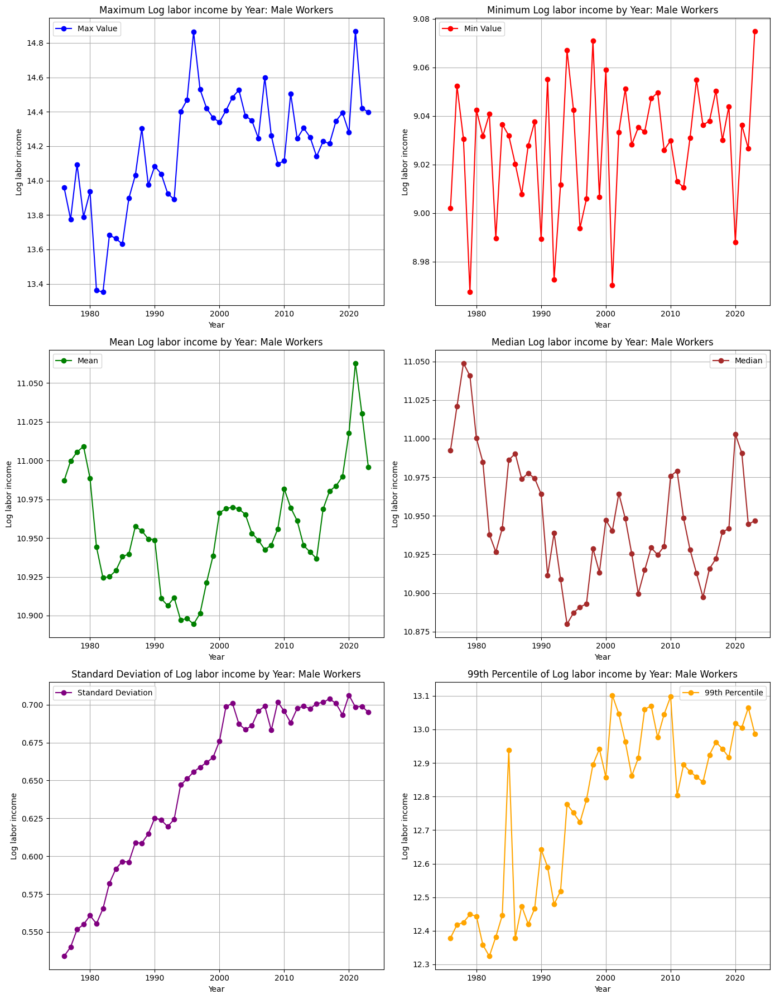

In [22]:
plot_variable_statistics('log_labor_income', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=False)

Figure saved to: ./figures/log_labor_income_Male_statistics_trimmed.png


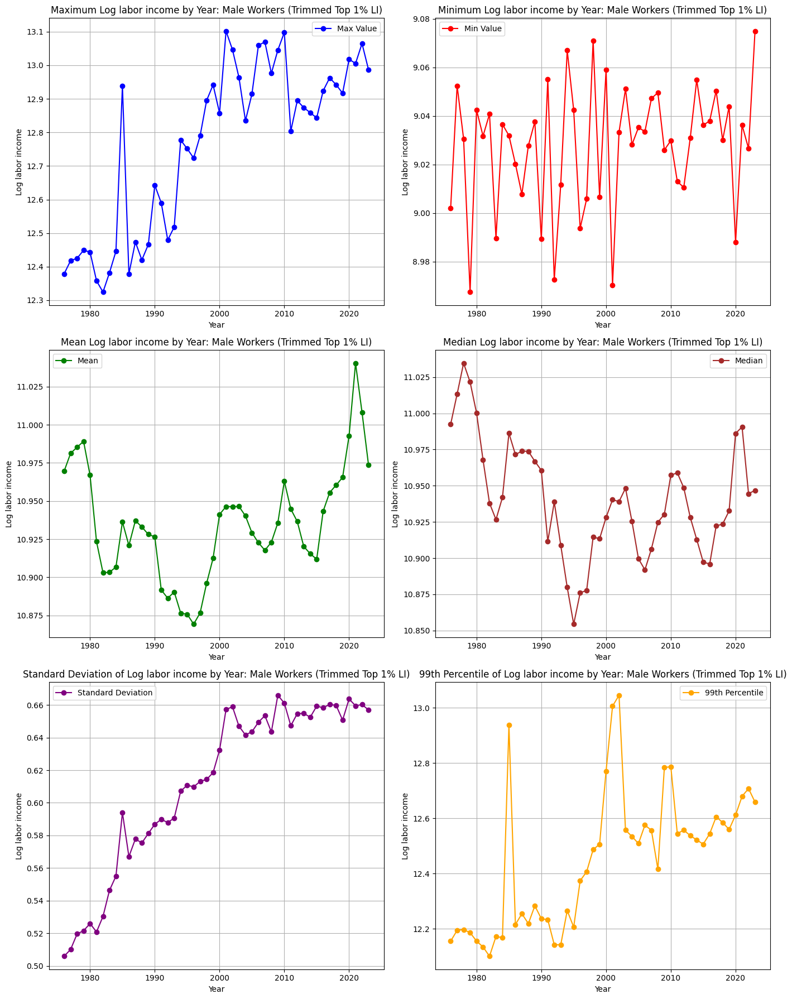

In [23]:
plot_variable_statistics('log_labor_income', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

Figure saved to: ./figures/labor_income_Male_statistics.png


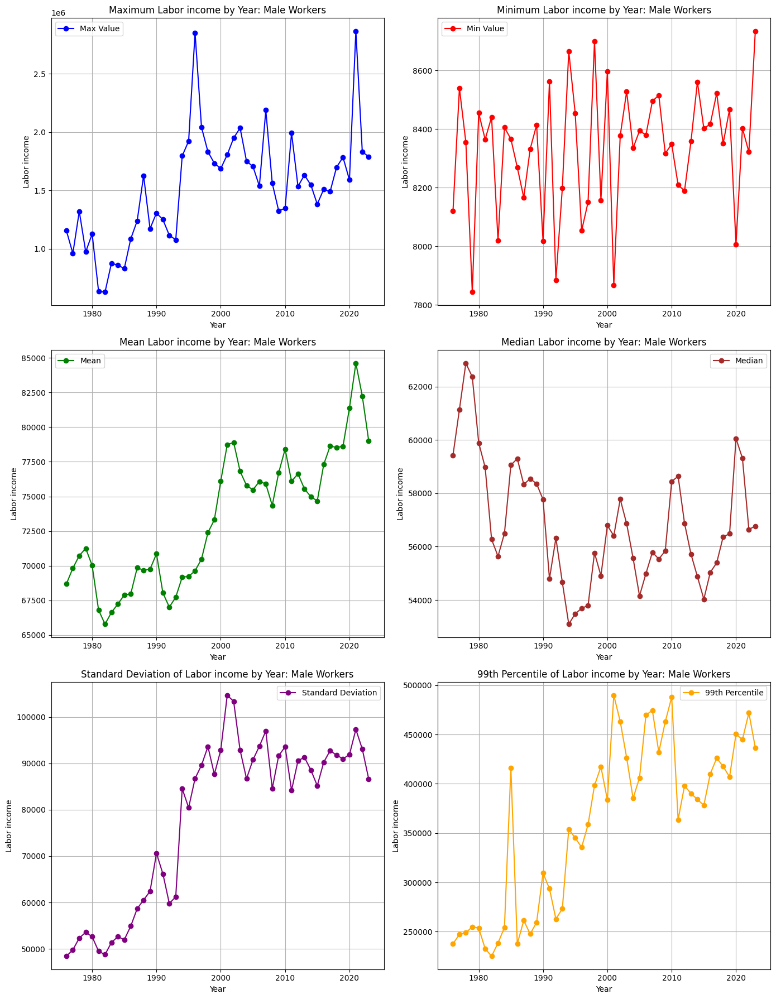

In [24]:
plot_variable_statistics('labor_income', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=False)

Figure saved to: ./figures/labor_income_Male_statistics_trimmed.png


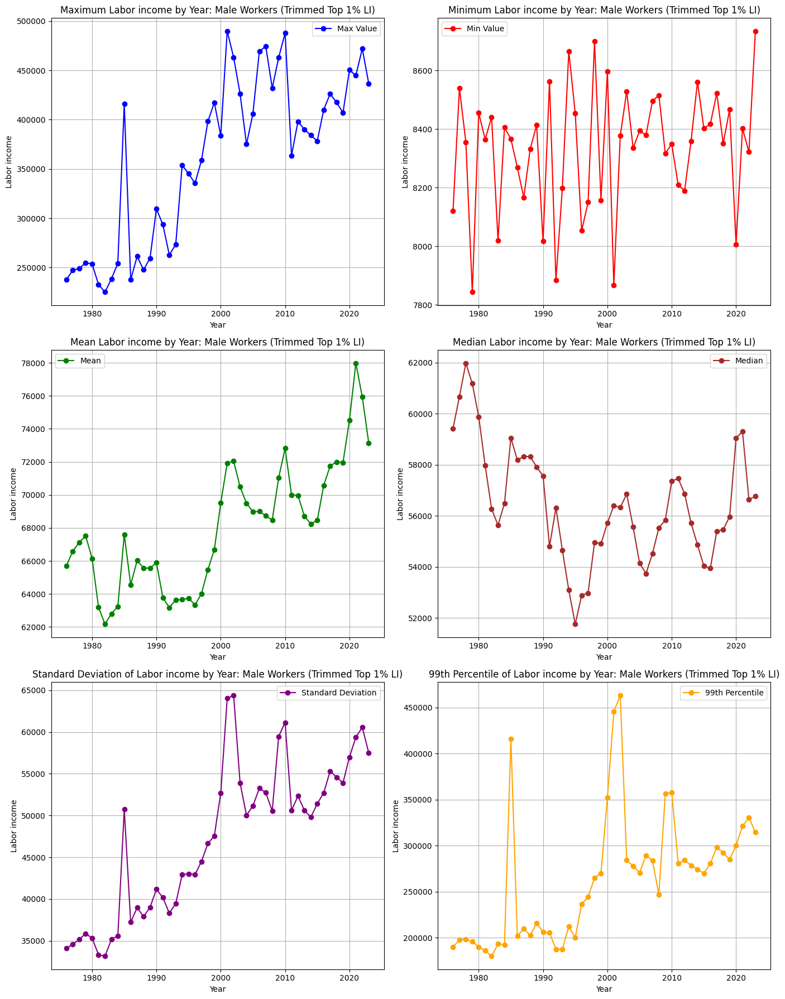

In [25]:
plot_variable_statistics('labor_income', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

Figure saved to: ./figures/OINCWAGE_Male_statistics.png


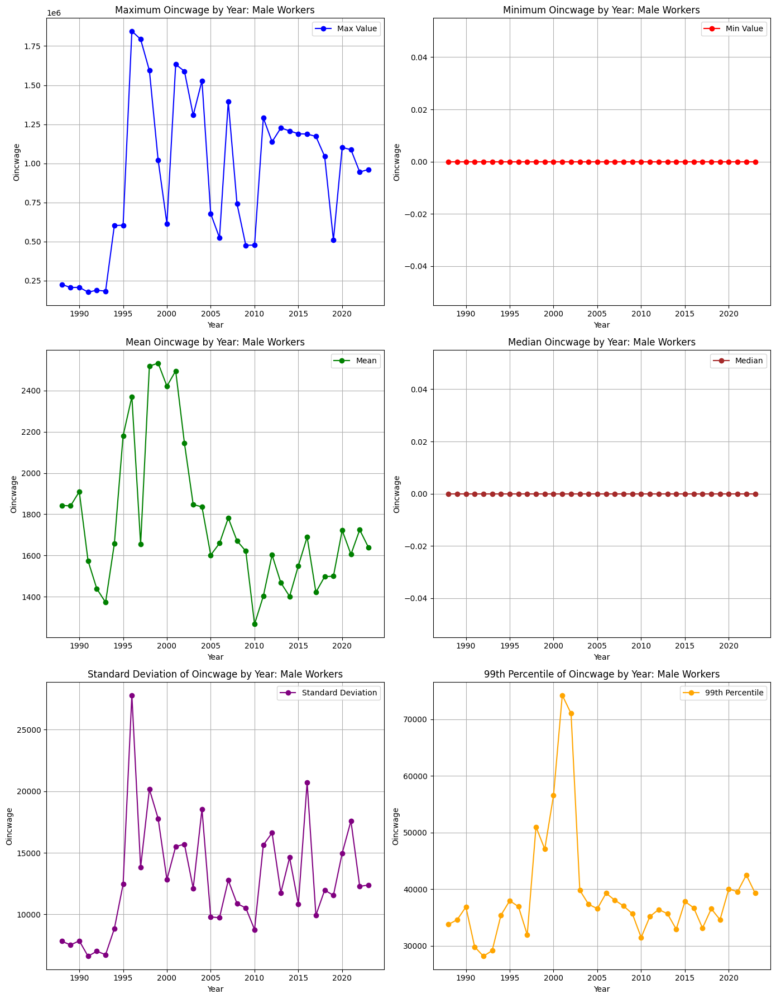

In [26]:
plot_variable_statistics('OINCWAGE', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=False)

Figure saved to: ./figures/OINCWAGE_Male_statistics_trimmed.png


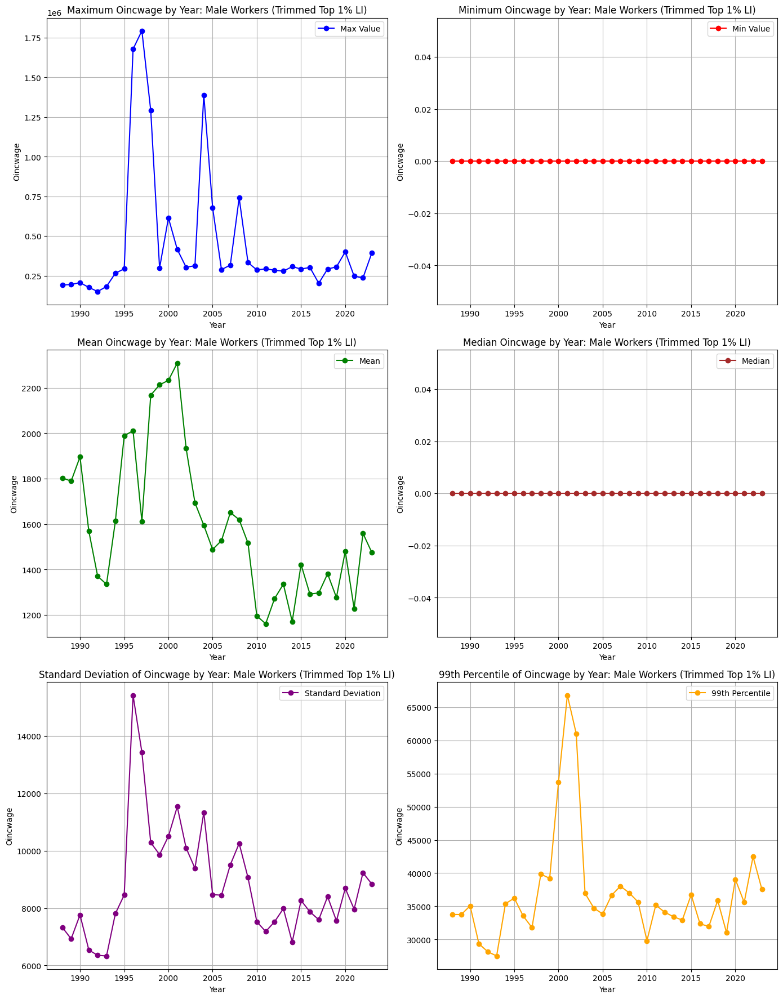

In [27]:
plot_variable_statistics('OINCWAGE', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

Figure saved to: ./figures/OINCBUS_Male_statistics.png


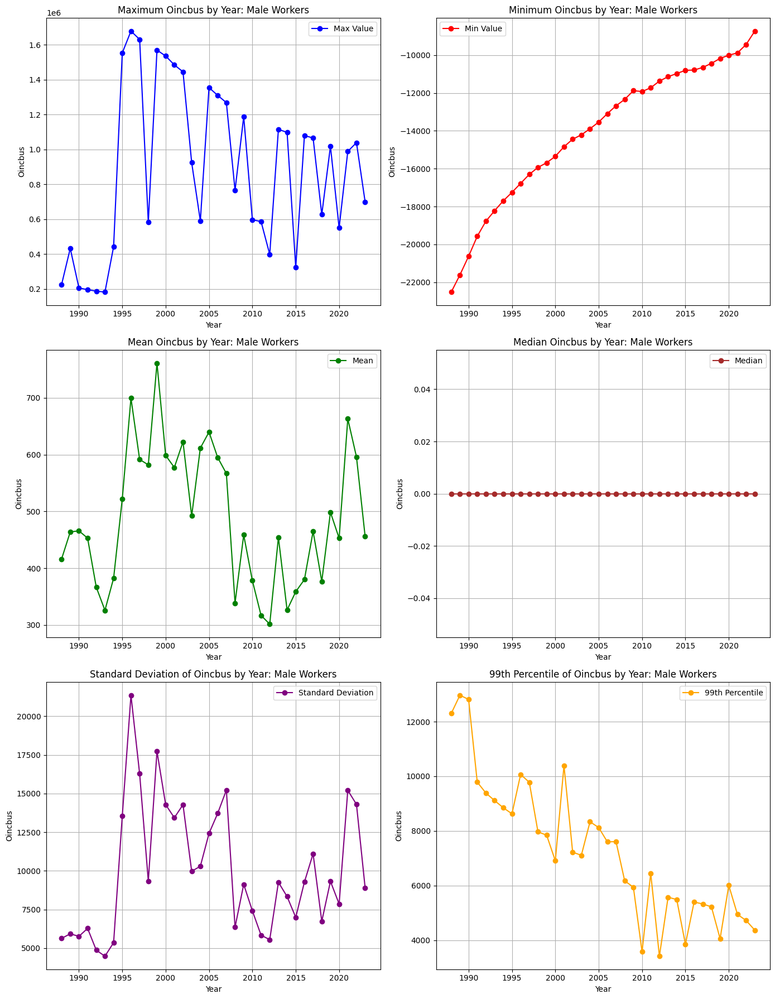

In [28]:
plot_variable_statistics('OINCBUS', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=False)

Figure saved to: ./figures/OINCBUS_Male_statistics_trimmed.png


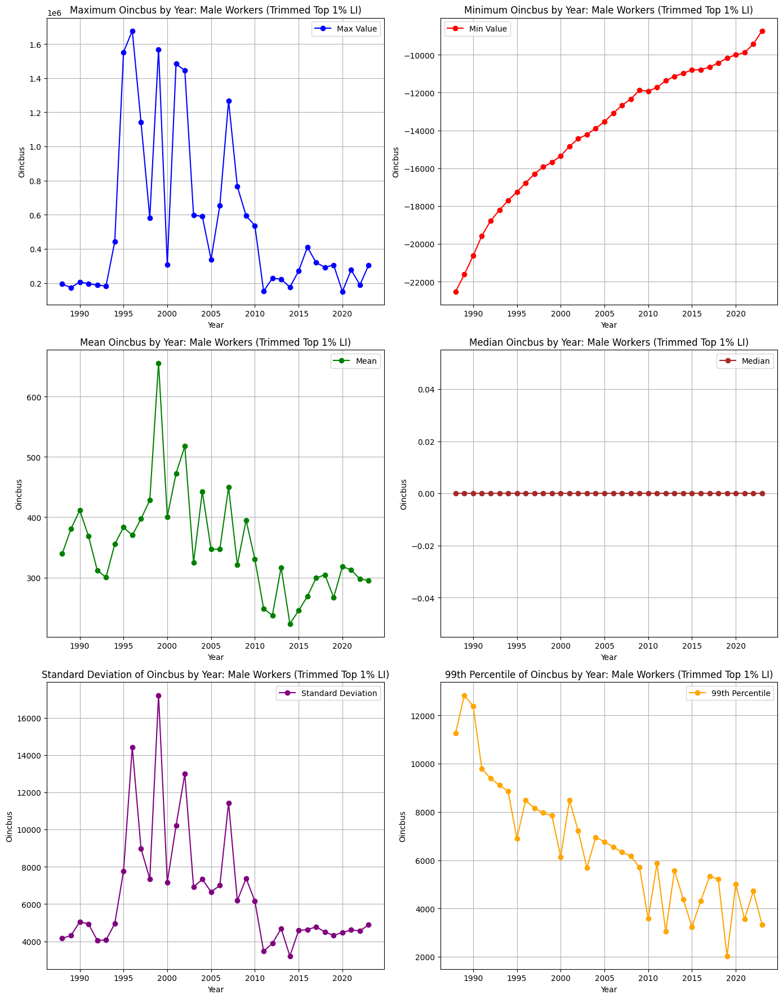

In [29]:
plot_variable_statistics('OINCBUS', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

Figure saved to: ./figures/OINCFARM_Male_statistics.png


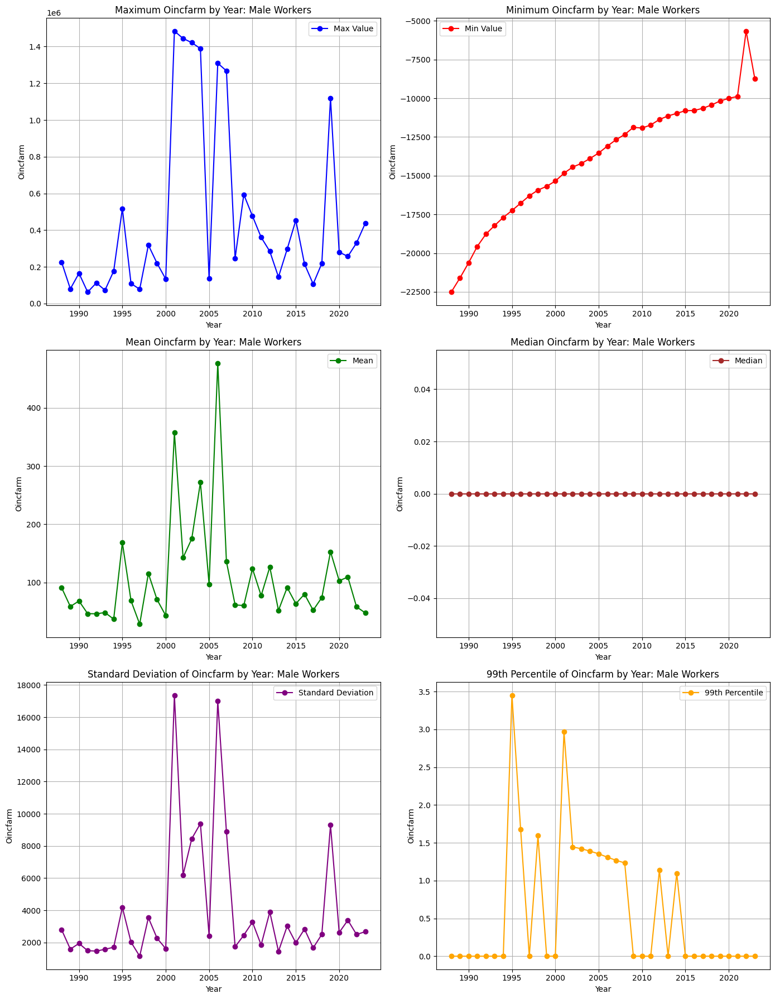

In [30]:
plot_variable_statistics('OINCFARM', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=False)

Figure saved to: ./figures/OINCFARM_Male_statistics_trimmed.png


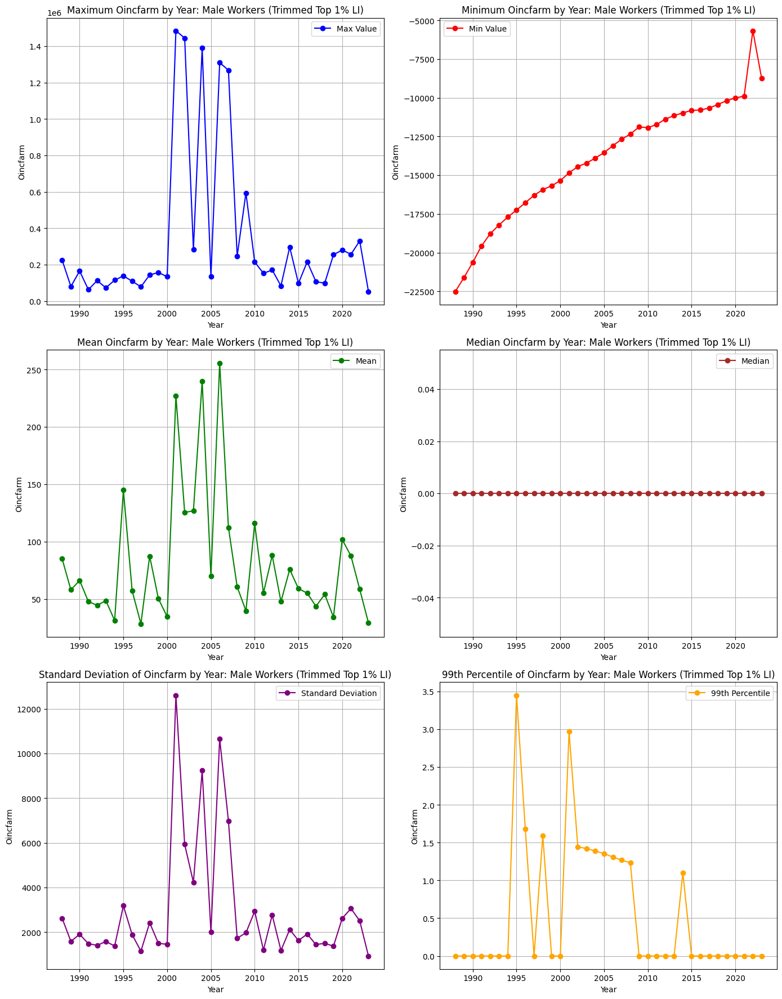

In [31]:
plot_variable_statistics('OINCFARM', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

Figure saved to: ./figures/INCWAGE_Male_statistics_trimmed.png


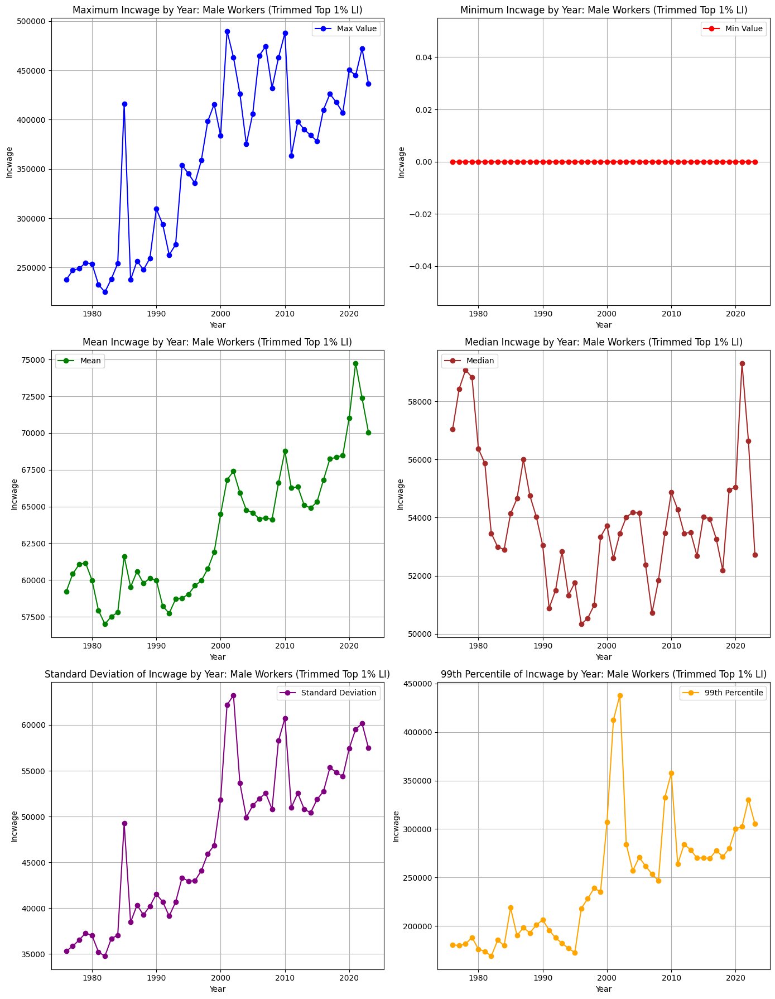

In [32]:
plot_variable_statistics('INCWAGE', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

Figure saved to: ./figures/INCWAGE_Male_statistics.png


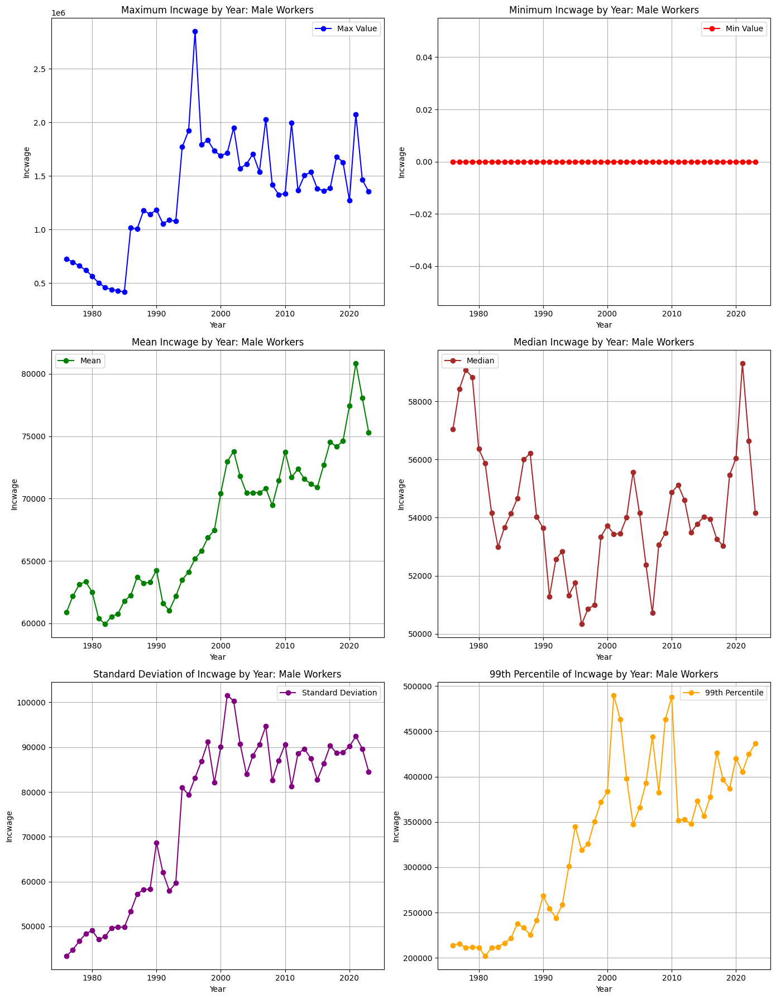

In [33]:
plot_variable_statistics('INCWAGE', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=False)

Figure saved to: ./figures/INCBUS_Male_statistics_trimmed.png


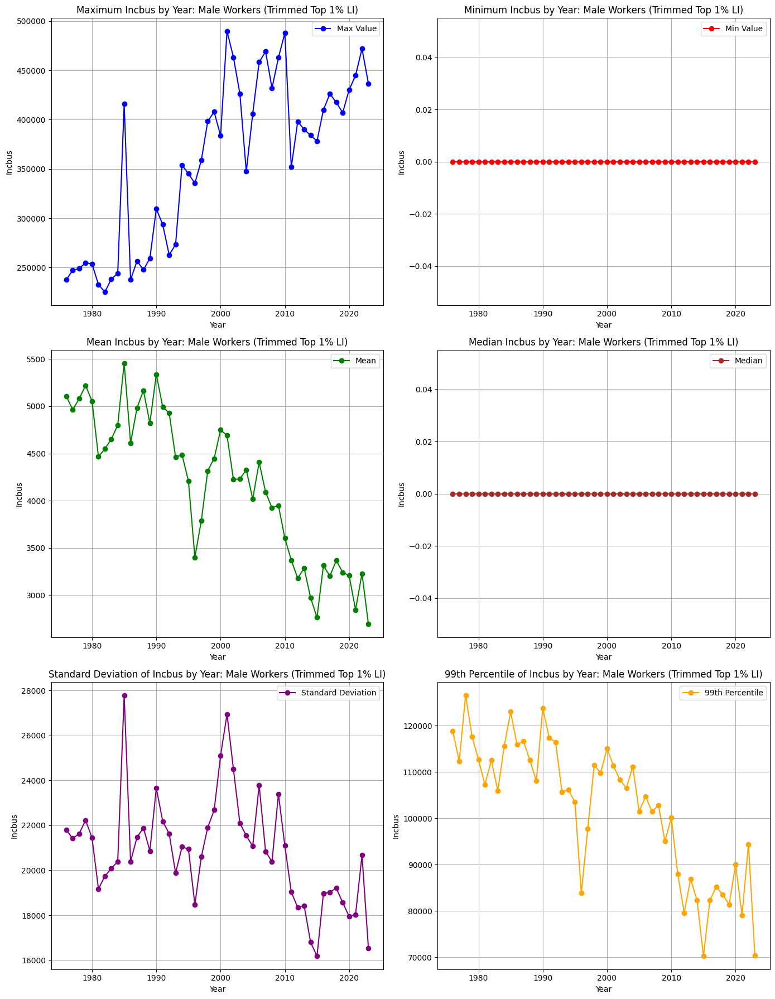

In [34]:
plot_variable_statistics('INCBUS', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

Figure saved to: ./figures/INCLONGJ_Male_statistics.png


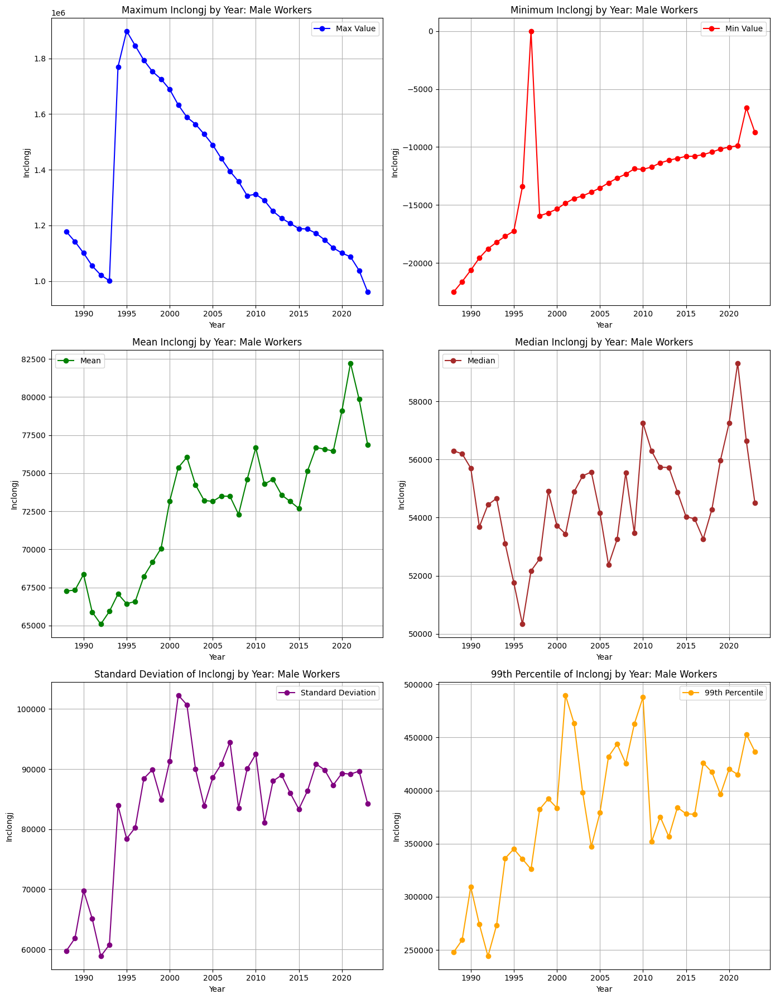

In [35]:
plot_variable_statistics('INCLONGJ', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=False)

Figure saved to: ./figures/INCLONGJ_Male_statistics_trimmed.png


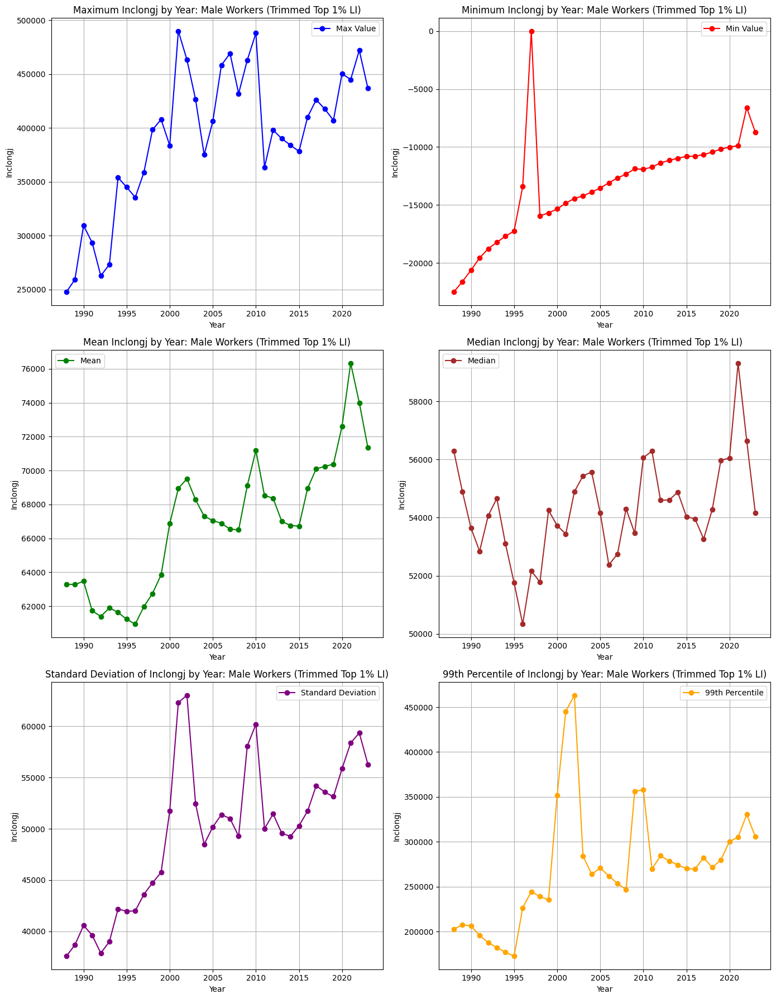

In [36]:
plot_variable_statistics('INCLONGJ', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

Figure saved to: ./figures/INCLONGJ_1_RAW_Male_statistics.png


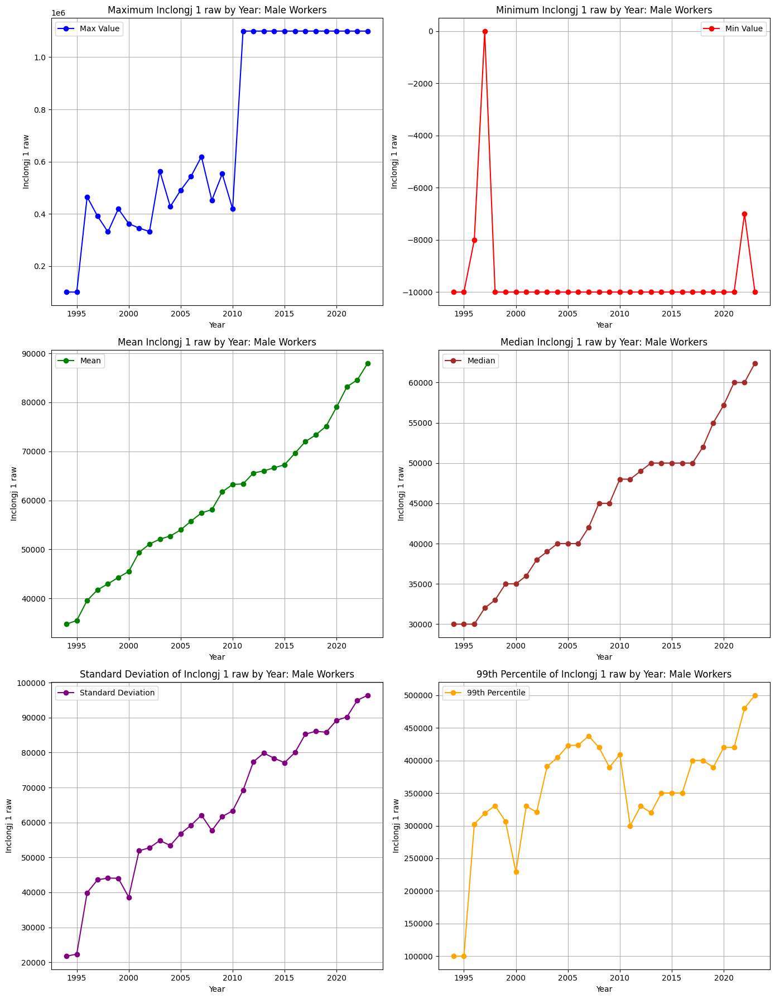

Figure saved to: ./figures/INCLONGJ_1_RAW_Male_statistics_trimmed.png


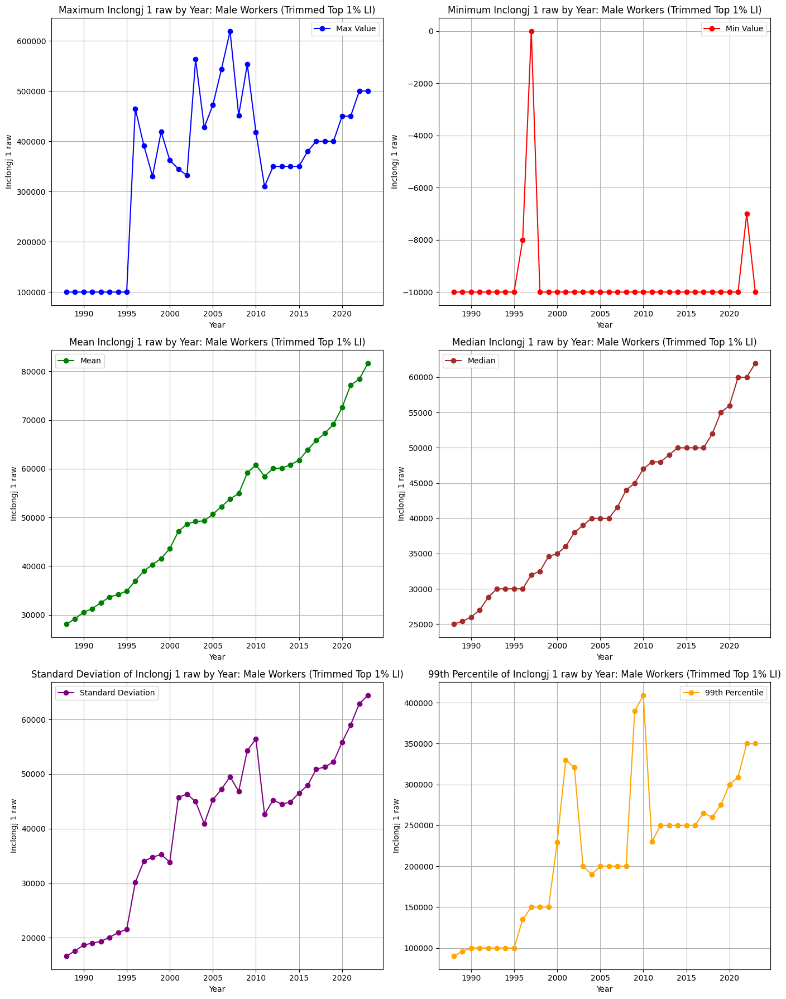

KeyError: 'INCLONGJ_2_APPLY TOPCODE_SWAPS'

In [37]:
plot_variable_statistics('INCLONGJ_1_RAW', range(1994, 2024), sex=1, data_path='./data/cps_data/', trim_data=False)

plot_variable_statistics('INCLONGJ_1_RAW', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

plot_variable_statistics('INCLONGJ_2_APPLY TOPCODE_SWAPS', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

plot_variable_statistics('INCLONGJ_2_APPLY TOPCODE_SWAPS', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

plot_variable_statistics('INCLONGJ_2_1_FILL_IN_TOPCODES', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

plot_variable_statistics('INCLONGJ_2_2_RECONSTRUCT_AFTER_1988', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

plot_variable_statistics('INCLONGJ_3_FILTER_BY_AGE', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

plot_variable_statistics('INCLONGJ_4_ZERO_HOURS_NONWORKERS', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

plot_variable_statistics('INCLONGJ_5_ADJUST_FOR_INFLATION', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

plot_variable_statistics('INCLONGJ_6_NEG_RENTS_SELF_EMPLOYED_INCOME_0', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

plot_variable_statistics('INCLONGJ_7_ADJUST_CAP_UNDERREPORTING', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

plot_variable_statistics('INCLONGJ_8_CALCULATED_COLUMNS_INCOME', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

In [ ]:
#INCWAGE PROCESS

Figure saved to: ./figures/INCWAGE_1_RAW_Male_statistics.png


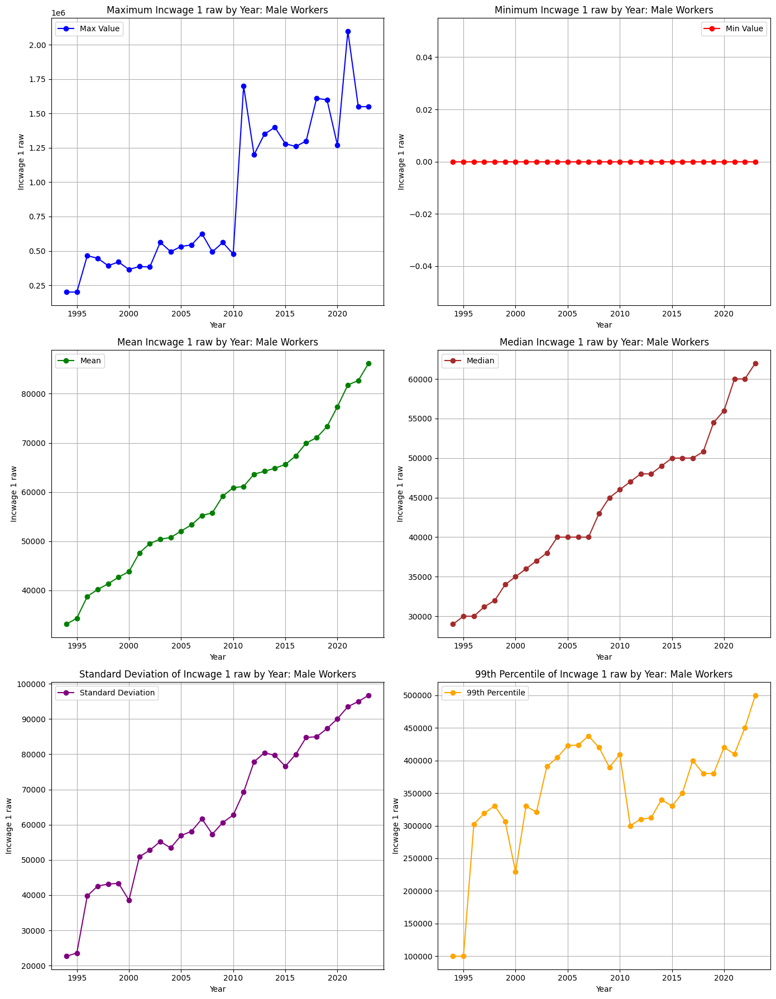

In [9]:
plot_variable_statistics('INCWAGE_1_RAW', range(1994, 2024), sex=1, data_path='./data/cps_data/', trim_data=False)

Figure saved to: ./figures/INCWAGE_1_RAW_Male_statistics_trimmed.png


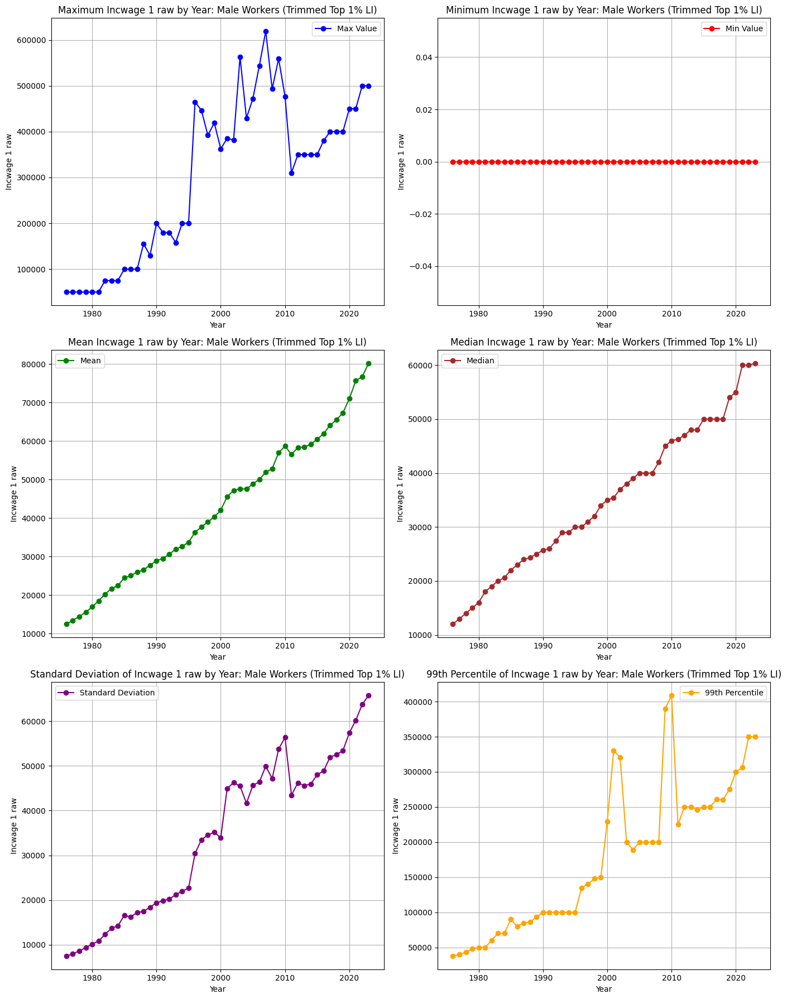

In [10]:
plot_variable_statistics('INCWAGE_1_RAW', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)


In [11]:
plot_variable_statistics('INCWAGE_2_APPLY TOPCODE_SWAPS', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

KeyError: 'INCWAGE_2_APPLY TOPCODE_SWAPS'

Figure saved to: ./figures/INCWAGE_2_1_FILL_IN_TOPCODES_Male_statistics_trimmed.png


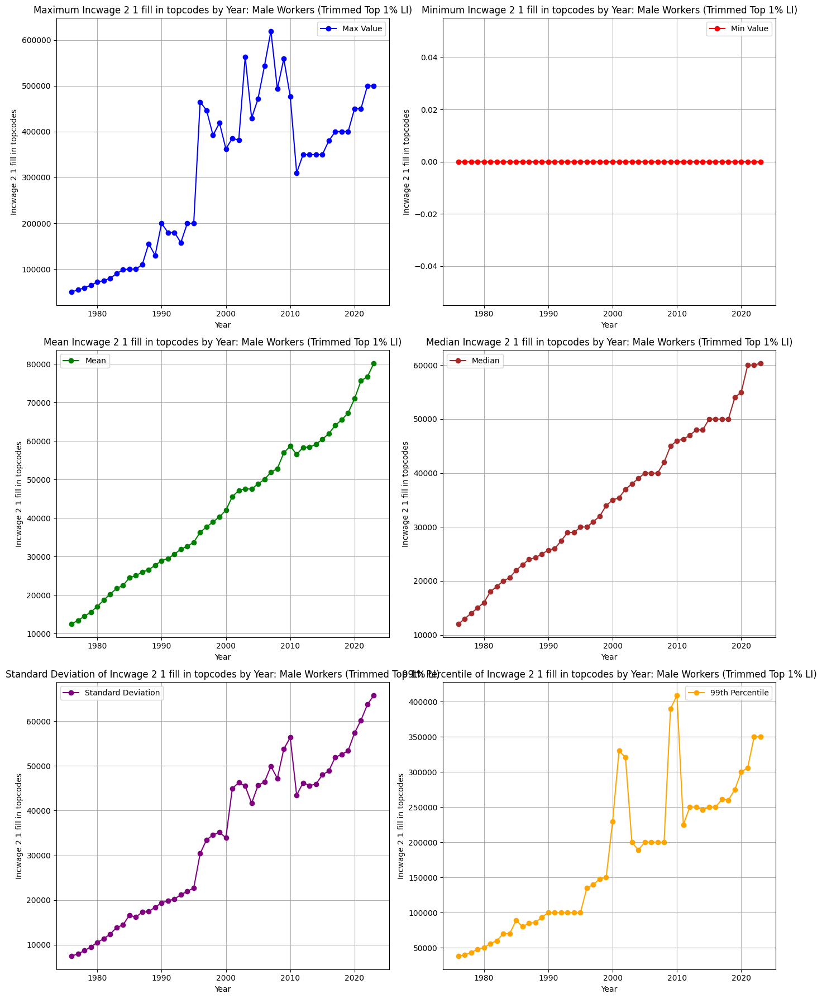

In [14]:

plot_variable_statistics('INCWAGE_2_1_FILL_IN_TOPCODES', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)


Figure saved to: ./figures/INCWAGE_2_2_RECONSTRUCT_AFTER_1988_Male_statistics_trimmed.png


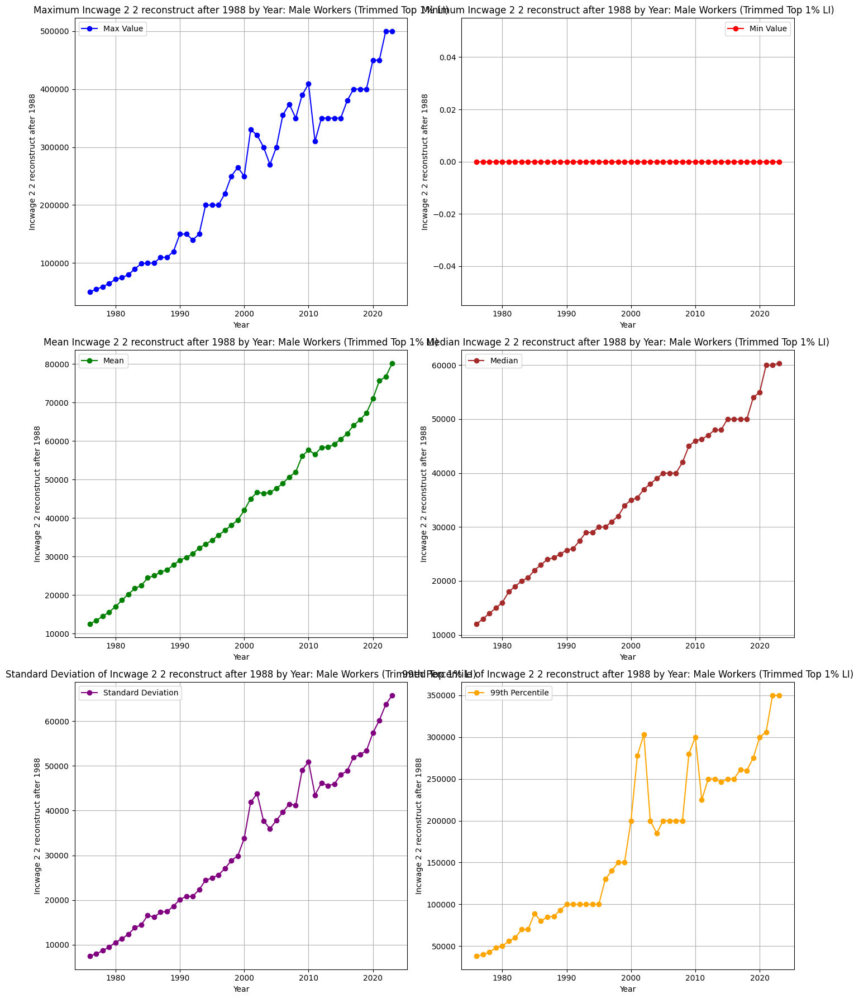

In [15]:

plot_variable_statistics('INCWAGE_2_2_RECONSTRUCT_AFTER_1988', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)


Figure saved to: ./figures/INCWAGE_3_FILTER_BY_AGE_Male_statistics_trimmed.png


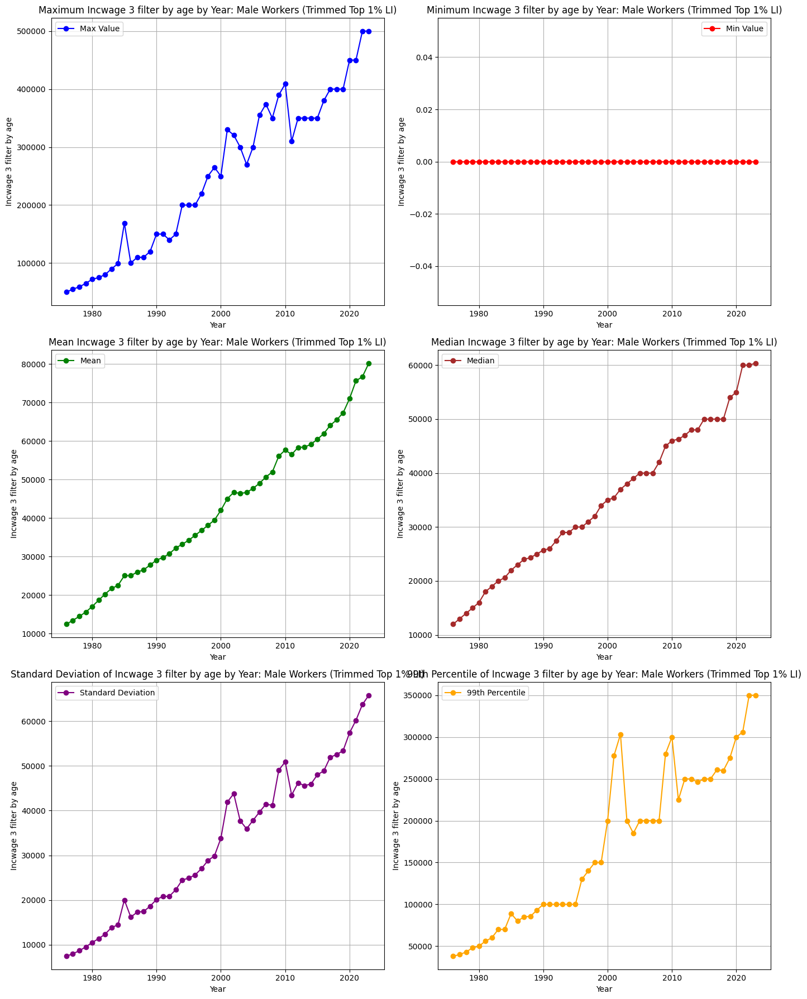

In [16]:

plot_variable_statistics('INCWAGE_3_FILTER_BY_AGE', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)


Figure saved to: ./figures/INCWAGE_4_ZERO_HOURS_NONWORKERS_Male_statistics_trimmed.png


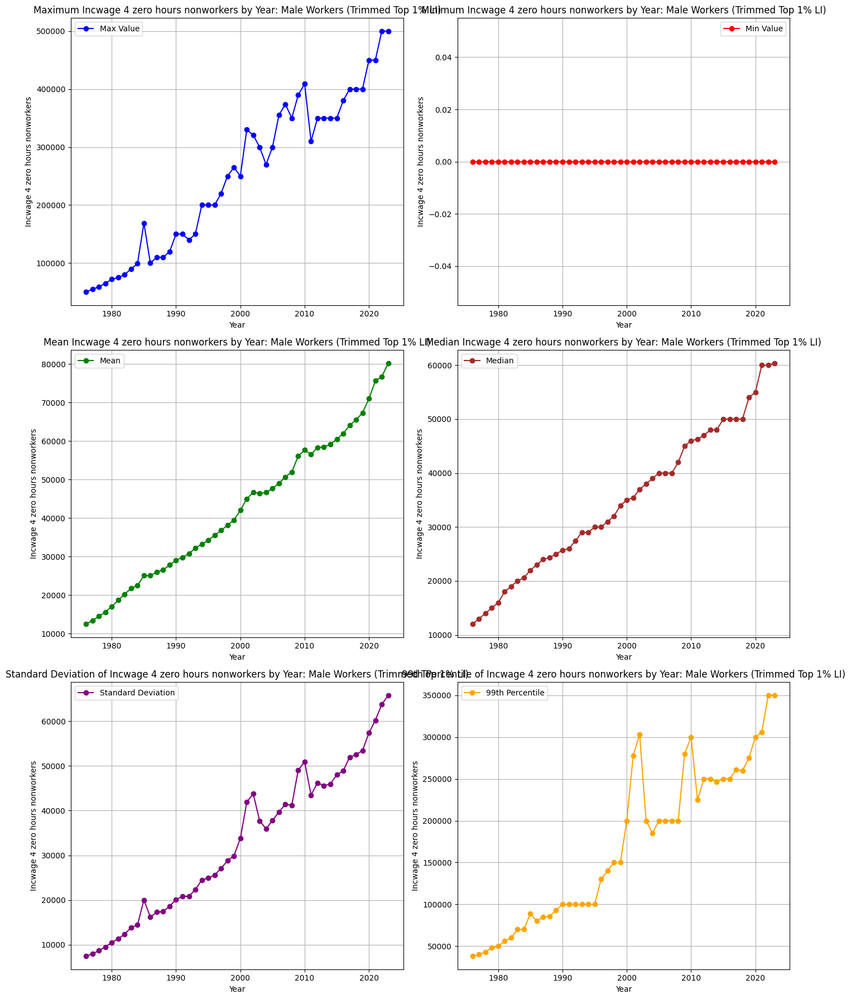

In [17]:

plot_variable_statistics('INCWAGE_4_ZERO_HOURS_NONWORKERS', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

Figure saved to: ./figures/INCWAGE_5_ADJUST_FOR_INFLATION_Male_statistics_trimmed.png


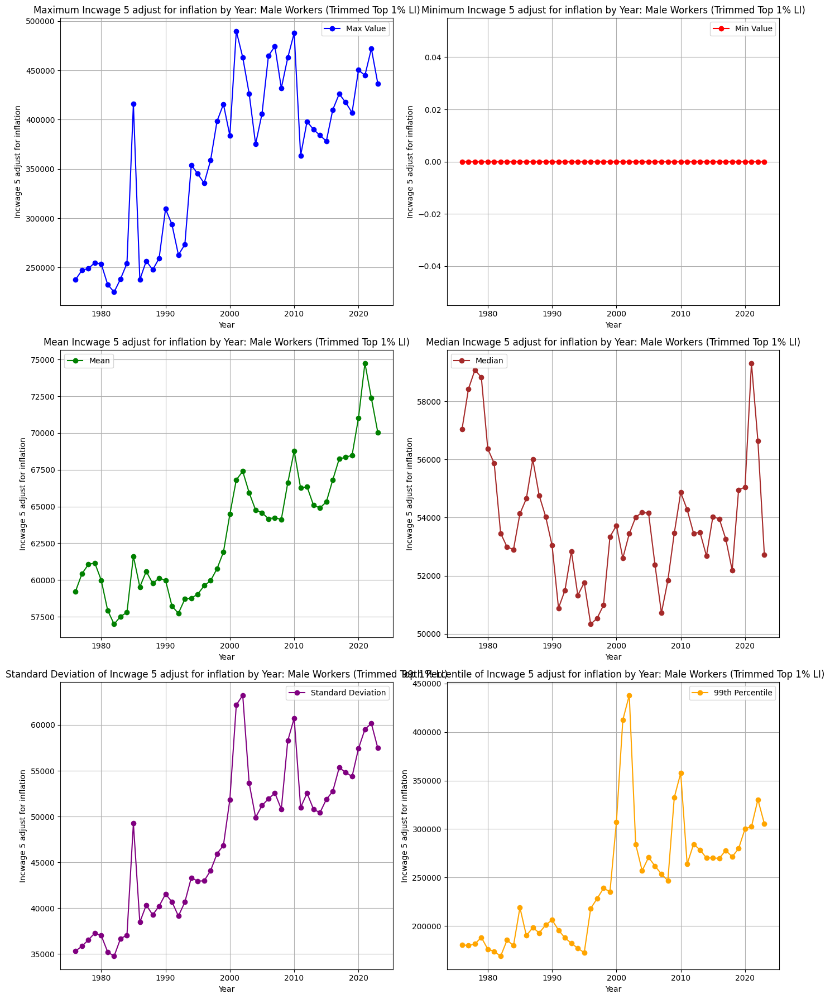

In [18]:
plot_variable_statistics('INCWAGE_5_ADJUST_FOR_INFLATION', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)


Figure saved to: ./figures/INCWAGE_6_NEG_RENTS_SELF_EMPLOYED_INCOME_0_Male_statistics_trimmed.png


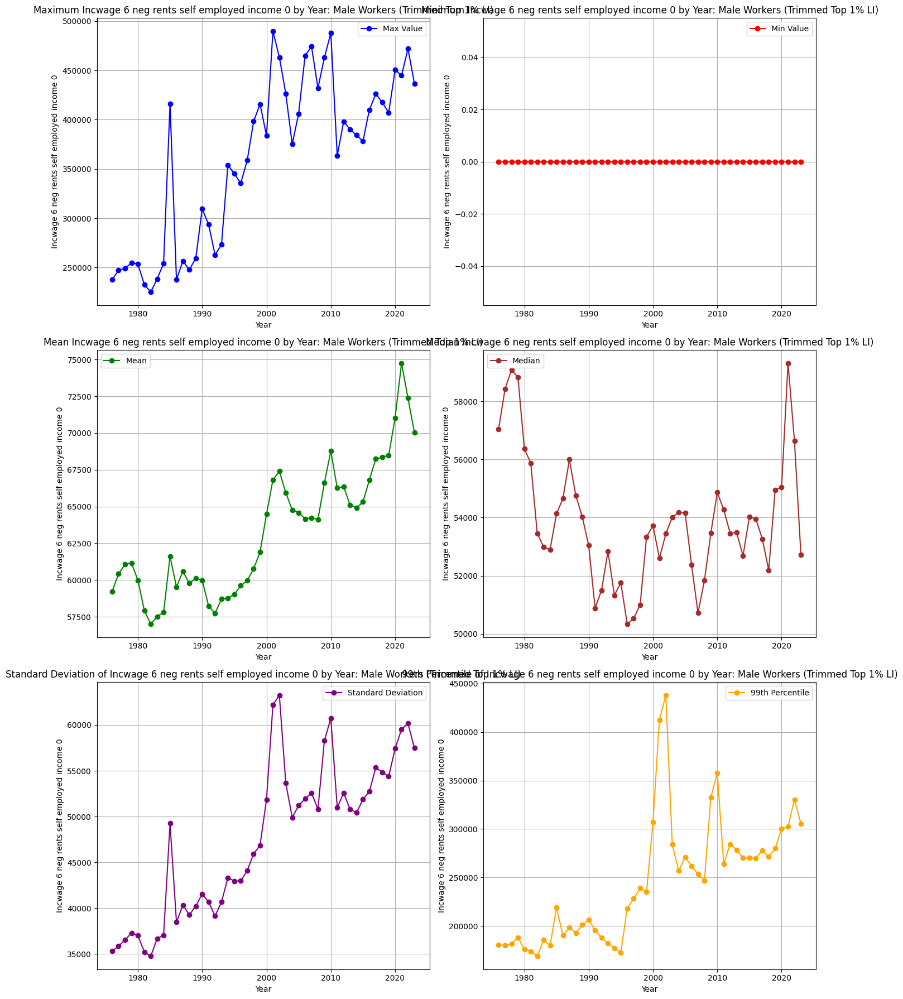

In [19]:

plot_variable_statistics('INCWAGE_6_NEG_RENTS_SELF_EMPLOYED_INCOME_0', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)


Figure saved to: ./figures/INCWAGE_7_ADJUST_CAP_UNDERREPORTING_Male_statistics_trimmed.png


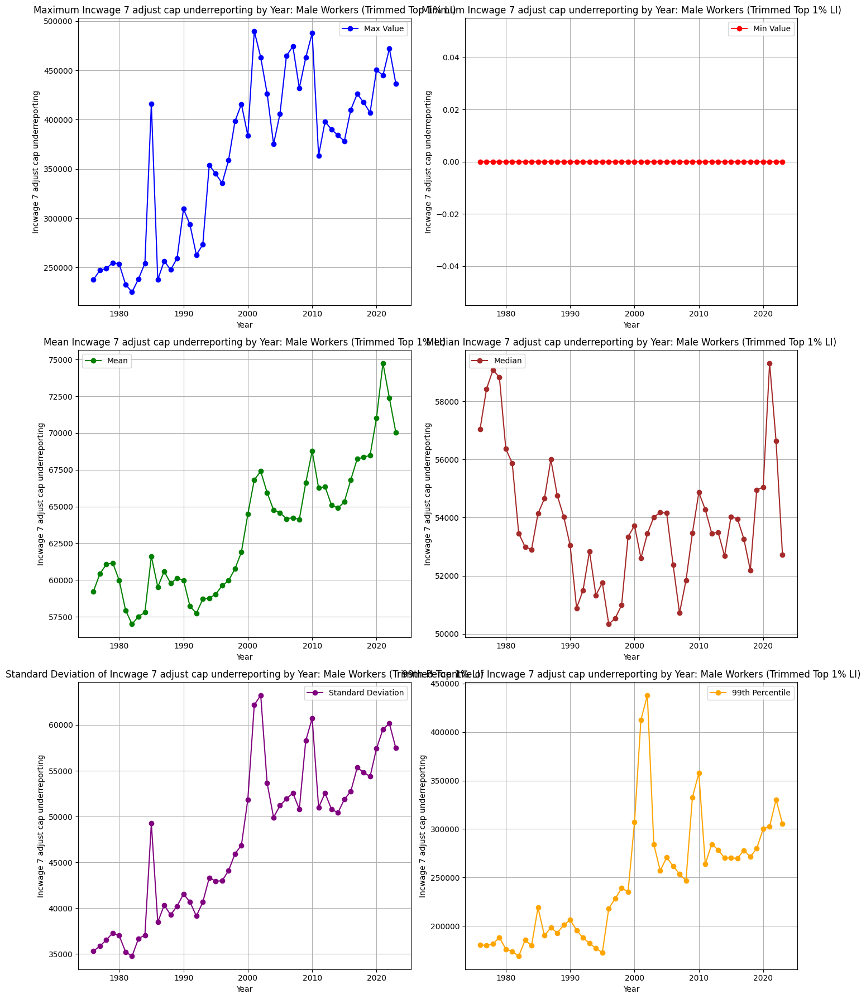

In [20]:

plot_variable_statistics('INCWAGE_7_ADJUST_CAP_UNDERREPORTING', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)


Figure saved to: ./figures/INCWAGE_8_CALCULATED_COLUMNS_INCOME_Male_statistics_trimmed.png


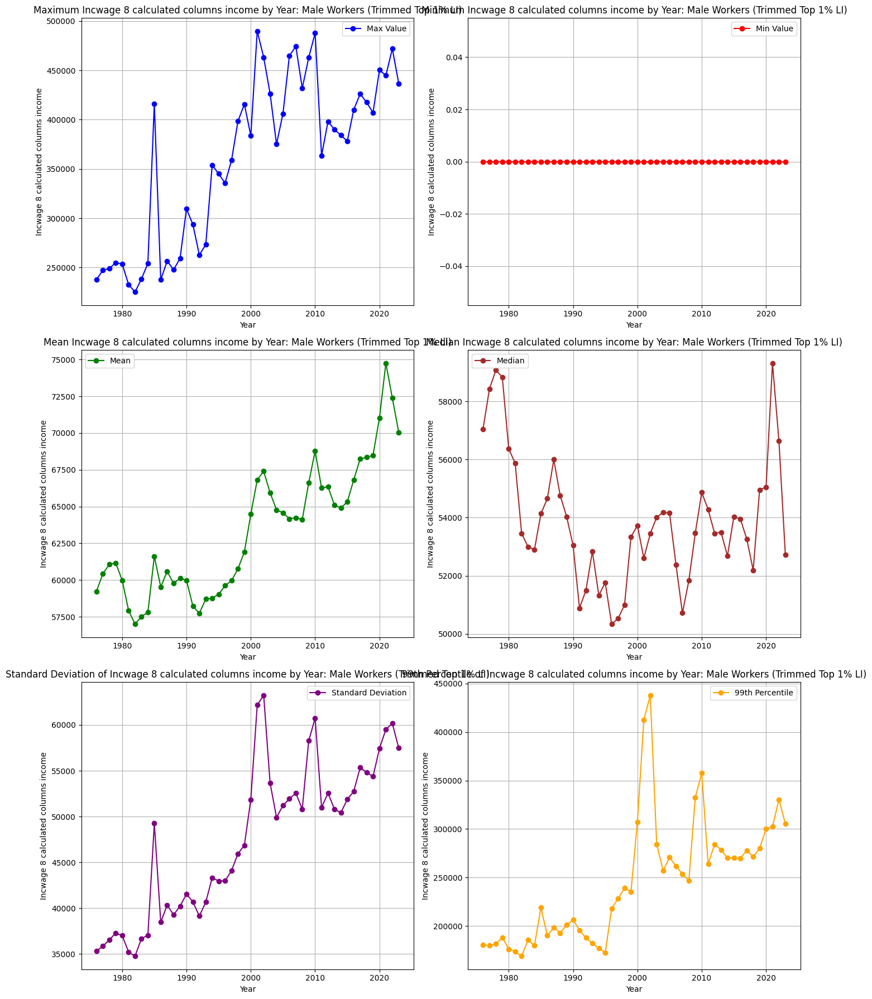

In [21]:

plot_variable_statistics('INCWAGE_8_CALCULATED_COLUMNS_INCOME', range(1976, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

Figure saved to: ./figures/INCLONGJ_1_RAW_SWAPPED_Male_statistics_trimmed.png


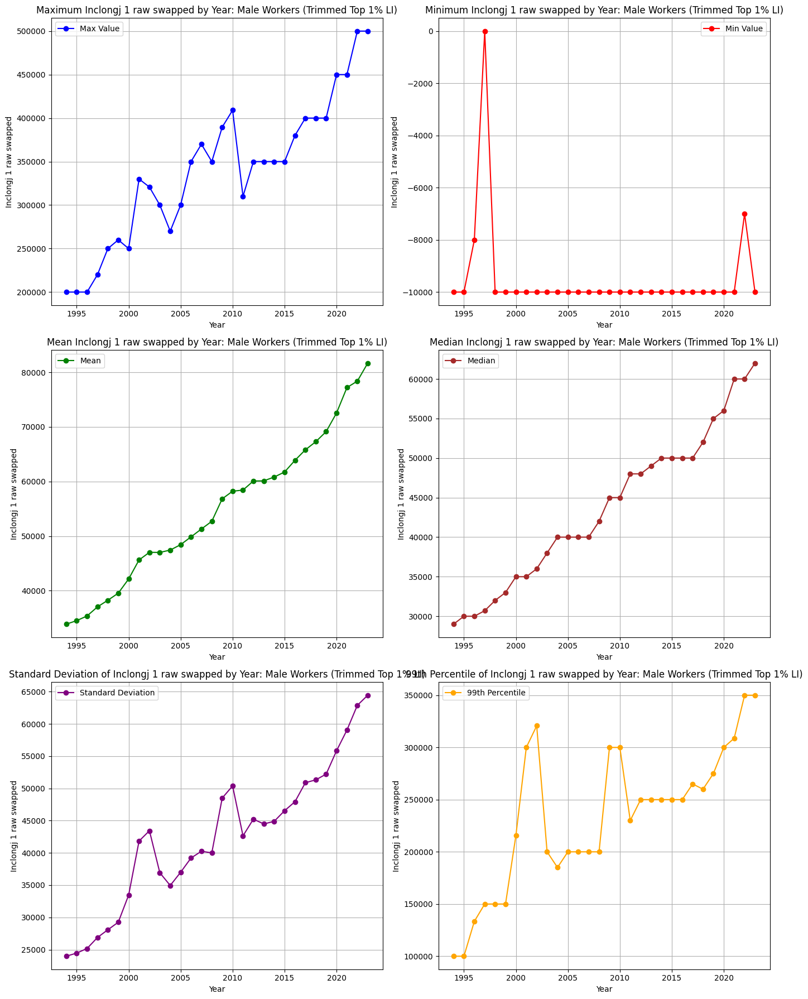

In [8]:
plot_variable_statistics('INCLONGJ_1_RAW_SWAPPED', range(1994, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

Figure saved to: ./figures/INCLONGJ_1_RAW_SWAPPED_Male_statistics.png


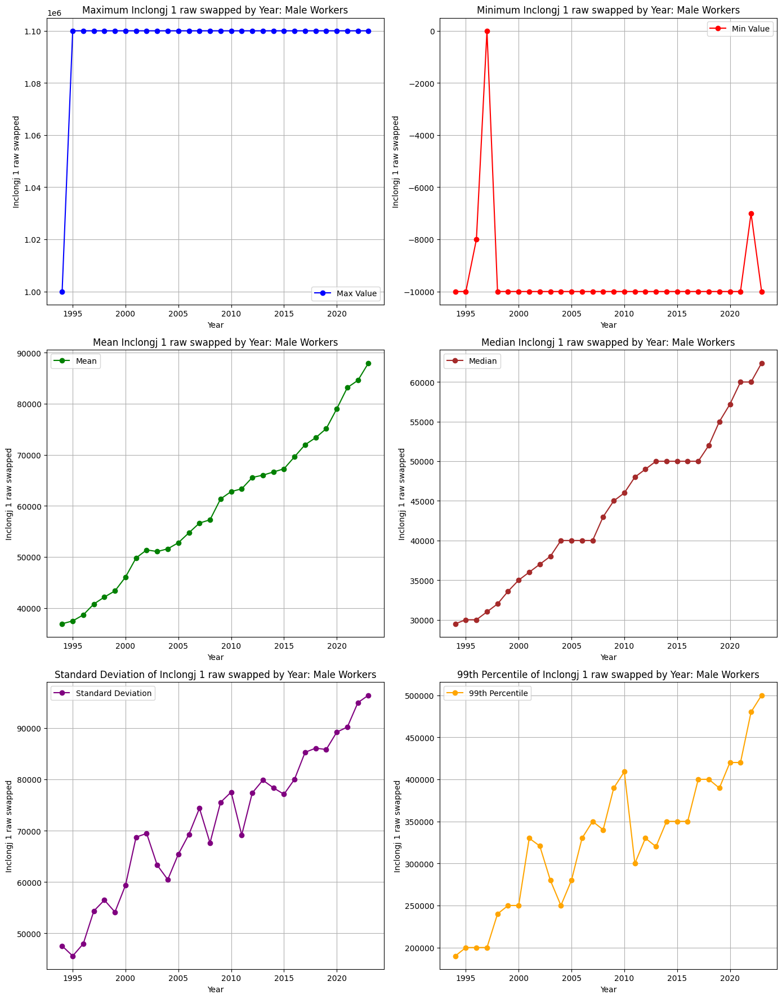

In [9]:
plot_variable_statistics('INCLONGJ_1_RAW_SWAPPED', range(1994, 2024), sex=1, data_path='./data/cps_data/', trim_data=False)

Figure saved to: ./figures/INCLONGJ_1_RAW_SWAPPED_Male_statistics.png


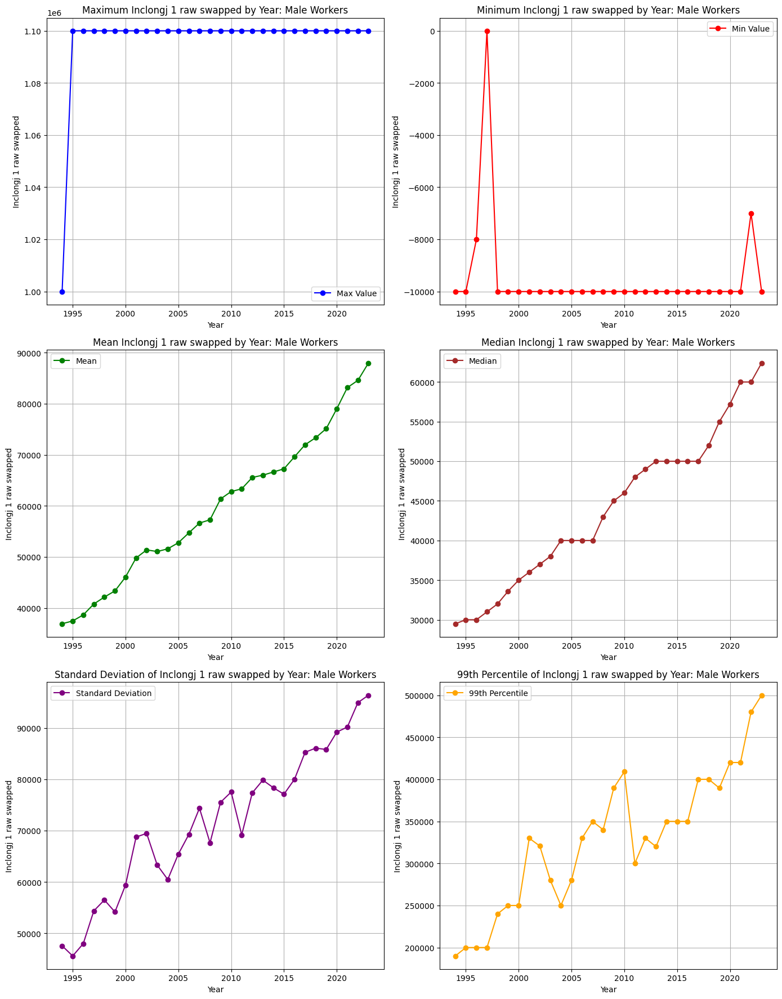

In [49]:
plot_variable_statistics('INCLONGJ_1_RAW_SWAPPED', range(1994, 2024), sex=1, data_path='./data/cps_data/', trim_data=False)

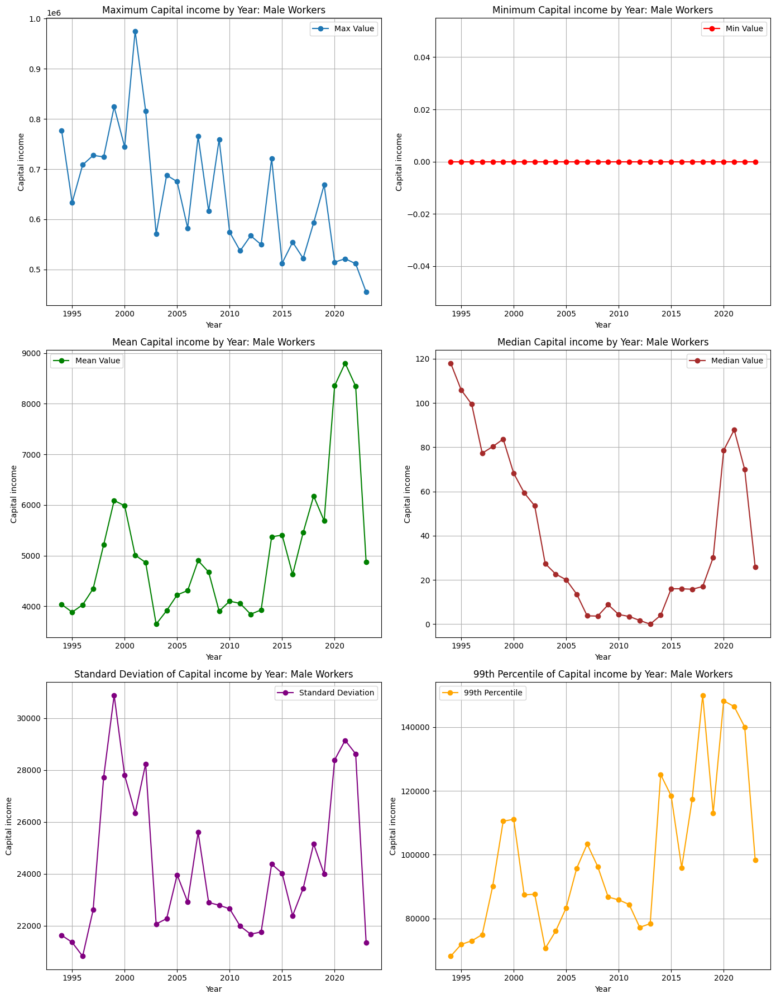

In [187]:
plot_variable_statistics('capital_income', range(1994, 2024), sex=1, data_path='./data/cps_data/', trim_data=False)

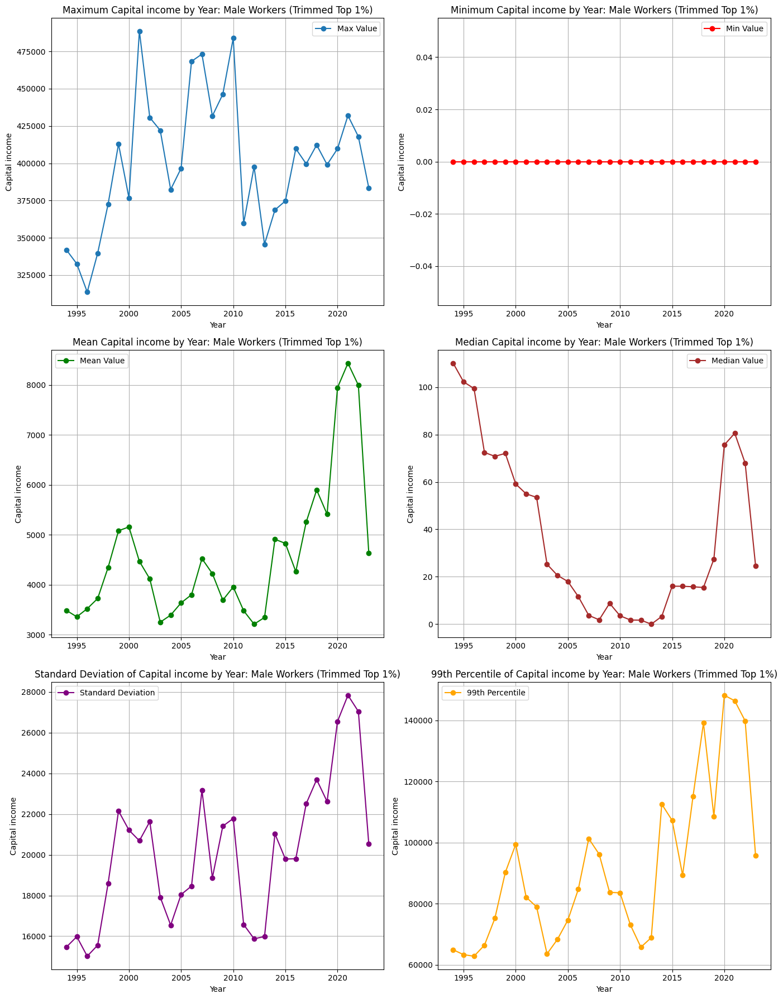

In [188]:
plot_variable_statistics('capital_income', range(1994, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)

In [230]:
print(swap_df.columns)

Index(['YEAR', 'SERIAL', 'PERNUM', 'incwage_swap', 'incbus_swap',
       'incfarm_swap', 'incss_swap', 'incwelfr_swap', 'incgov_swap',
       'incaloth_swap', 'incretir_swap', 'incssi_swap', 'incdrt_swap',
       'incint_swap', 'incunemp_swap', 'incwkcom_swap', 'incvet_swap',
       'incsurv_swap', 'incdisab_swap', 'incdivid_swap', 'incrent_swap',
       'inceduc_swap', 'incalim_swap', 'incasist_swap', 'incother_swap',
       'oincwage_swap', 'oincbus_swap', 'oincfarm_swap', 'incchild_swap',
       'incdisa1_swap', 'incdisa2_swap', 'increti1_swap', 'increti2_swap',
       'incsurv1_swap', 'incsurv2_swap', 'INCLONGJ_SWAP'],
      dtype='object')


In [220]:
apply_inclongj_swap(df_2001, swap_df)

,YEAR,SERIAL,MONTH,CPSID,ASECFLAG,HFLAG,ASECWTH,CPI99,REGION,STATEFIP,...,is_full_time_full_year,stateXindustry_1950,stateXindustry,divisionXindustry,regionXindustry,labor_income_99,capital_income_99,winsor99,INCLONGJ_new,INCLONG_RAW_SWAPPED
0,2001,1,3,0,1,NaN,449.78,0.967,11,23,...,False,23-859,23-810,11-859,42-810,NaN,NaN,False,34705.470445,23381.0
1,2001,1,3,0,1,NaN,449.78,0.967,11,23,...,False,23-0,23-0,11-0,42-0,NaN,NaN,False,4453.035000,3000.0
2,2001,2,3,20001202372600,1,NaN,407.41,0.967,11,23,...,False,23-0,23-0,11-0,42-0,NaN,NaN,False,0.000000,0.0
3,2001,3,3,20001202368100,1,NaN,228.99,0.967,11,23,...,True,23-698,23-651,11-698,42-651,182574.43500,69470.854387,True,37108.625000,25000.0
4,2001,3,3,20001202368100,1,NaN,228.99,0.967,11,23,...,False,23-698,23-651,11-698,42-651,NaN,NaN,False,14843.450000,10000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150181,2001,98014,3,0,1,NaN,334.71,0.967,42,15,...,True,15-556,15-421,42-556,42-421,489830.88131,87400.245063,True,44530.350000,30000.0
150182,2001,98014,3,0,1,NaN,334.71,0.967,42,15,...,False,15-0,15-0,42-0,42-0,NaN,NaN,False,0.000000,0.0
150183,2001,98015,3,0,1,NaN,343.52,0.967,42,15,...,True,15-899,15-891,42-899,42-891,489830.88131,87400.245063,True,40077.315000,27000.0
150184,2001,98015,3,0,1,NaN,343.52,0.967,42,15,...,False,15-0,15-0,42-0,42-0,NaN,NaN,False,0.000000,0.0


In [ ]:
plot_variable_statistics('INCLONGJ_raw', range(1994, 2024), sex=1, data_path='./data/cps_data/', trim_data=Truet)

In [ ]:
plot_labor_income_statistics(range(1994, 2024), sex=1, data_path='./data/cps_data/', trim_data=True)
# plot for raw components- plot capital income for those years, also labor income oincwage and inclongj, inclongj_raw, plot those

In [9]:
def analyze_work_patterns():
    """Analyze hours worked and wage patterns around 2001-2002."""
    # Focus on relevant years
    years_to_analyze = range(1994, 2023)
    
    results = {}
    for year in years_to_analyze:
        year_data = pd.read_csv(f'./data/cps_data/{year}_sample.csv')
        year_data = year_data[year_data['is_full_time_full_year']]
        results[year] = {
            'median_hours': year_data['UHRSWORKLY'].median(),
            'p99_hours': year_data['UHRSWORKLY'].quantile(0.99),
            'median_wage': year_data['hourly_wage'].median(),
            'p99_wage': year_data['hourly_wage'].quantile(0.99),
            'count_high_hours': (year_data['UHRSWORKLY'] > 80).sum(),
            'total_count': len(year_data)
        }
    return pd.DataFrame(results).T

In [10]:
work_pattern_df = analyze_work_patterns()
work_pattern_df

,median_hours,p99_hours,median_wage,p99_wage,count_high_hours,total_count
1999,40.0,75.00,21.306612,122.626852,160.0,41997.0
2000,40.0,75.00,21.490000,135.788462,190.0,43174.0
2001,40.0,76.59,21.408822,171.270577,324.0,69542.0
2002,40.0,75.00,22.222077,178.175502,263.0,68274.0
2003,40.0,75.00,21.944165,135.603956,252.0,66756.0


In [63]:
df_2001_orig['winsor99'] != df_2001_2['winsor99']

ValueError: Can only compare identically-labeled Series objects

In [11]:
df_2000 = pd.read_csv(f'./data/cps_data/2000_sample.csv')
df_2001 = pd.read_csv(f'./data/cps_data/2001_sample.csv')
df_2002 = pd.read_csv(f'./data/cps_data/2002_sample.csv')
df_2003 = pd.read_csv(f'./data/cps_data/2003_sample.csv')
df_2004 = pd.read_csv(f'./data/cps_data/2004_sample.csv')

In [23]:
[col for col in df_2001.columns]

['YEAR',
 'SERIAL',
 'MONTH',
 'CPSID',
 'ASECFLAG',
 'HFLAG',
 'ASECWTH',
 'CPI99',
 'REGION',
 'STATEFIP',
 'HHINCOME',
 'PERNUM',
 'CPSIDV',
 'CPSIDP',
 'ASECWT',
 'AGE',
 'SEX',
 'RACE',
 'MARST',
 'EMPSTAT',
 'OCC',
 'OCC1950',
 'IND',
 'IND1950',
 'EDUC',
 'WKSWORK1',
 'UHRSWORKLY',
 'FTOTVAL',
 'INCTOT',
 'INCWAGE',
 'INCBUS',
 'INCFARM',
 'INCSS',
 'INCWELFR',
 'INCGOV',
 'INCALOTH',
 'INCRETIR',
 'INCSSI',
 'INCDRT',
 'INCINT',
 'INCUNEMP',
 'INCWKCOM',
 'INCVET',
 'INCSURV',
 'INCDISAB',
 'INCDIVID',
 'INCRENT',
 'INCEDUC',
 'INCCHILD',
 'INCALIM',
 'INCASIST',
 'INCOTHER',
 'INCRANN',
 'INCPENS',
 'INCLONGJ',
 'OINCBUS',
 'OINCFARM',
 'OINCWAGE',
 'SRCRETI1',
 'SRCRETI2',
 'INCRETI1',
 'INCRETI2',
 'SRCSURV1',
 'SRCSURV2',
 'INCSURV1',
 'INCSURV2',
 'INCDISA1',
 'INCDISA2',
 'INCRET1',
 'INCRET2',
 'INCPEN1',
 'INCPEN2',
 'INCRINT1',
 'INCRINT2',
 'INCCAPG',
 'SRCEARN',
 'INCLONGJ_1_RAW',
 'INCWAGE_SWAP',
 'INCBUS_SWAP',
 'INCFARM_SWAP',
 'INCSS_SWAP',
 'INCWELFR_SWAP',
 'IN

In [29]:
cps_df = df_2003
print(f"Year {cps_df['YEAR'].iloc[0]} before topcoding:")
print(cps_df['INCLONGJ_1_RAW'].describe())
print(f"Year {cps_df['YEAR'].iloc[0]} after topcoding:")
print(cps_df['INCLONGJ_2_APPLY TOPCODE_SWAPS'].describe())

Year 2003 before topcoding:
count    149844.000000
mean      24971.183351
std       40047.910765
min       -9999.000000
25%           0.000000
50%       15000.000000
75%       35000.000000
max      595494.000000
Name: INCLONGJ_1_RAW, dtype: float64
Year 2003 after topcoding:
count    1.498440e+05
mean     2.496068e+04
std      4.368939e+04
min     -9.999000e+03
25%      0.000000e+00
50%      1.500000e+04
75%      3.500000e+04
max      1.099999e+06
Name: INCLONGJ_2_APPLY TOPCODE_SWAPS, dtype: float64


In [83]:
mask = (df_2003[f'INCLONGJ_SWAP'].notna() & (df_2003[f'INCLONGJ_SWAP'] != 0))
df_2003['INCLONGJ_new'] = df_2003['INCLONGJ']
df_2003.loc[mask, 'INCLONGJ_new'] = df_2003[f'INCLONGJ_SWAP']
# there is an error that shows up when applying the swap value but the distribution of the swap values seems normal and the raw inclongj distribution seems normal

In [84]:
df_2003['INCLONGJ']

0         56856.40
1             0.00
2             0.00
3         12792.69
4         56856.40
            ...   
149839    -5685.64
149840    25585.38
149841    39799.48
149842    92391.65
149843    27006.79
Name: INCLONGJ, Length: 149844, dtype: float64

In [85]:
df_2003['INCLONGJ_new']

0         56856.40
1             0.00
2             0.00
3         12792.69
4         56856.40
            ...   
149839    -5685.64
149840    25585.38
149841    39799.48
149842    92391.65
149843    27006.79
Name: INCLONGJ_new, Length: 149844, dtype: float64

In [86]:
(df_2003['INCLONGJ'] != df_2003['INCLONGJ_new']).sum()

799

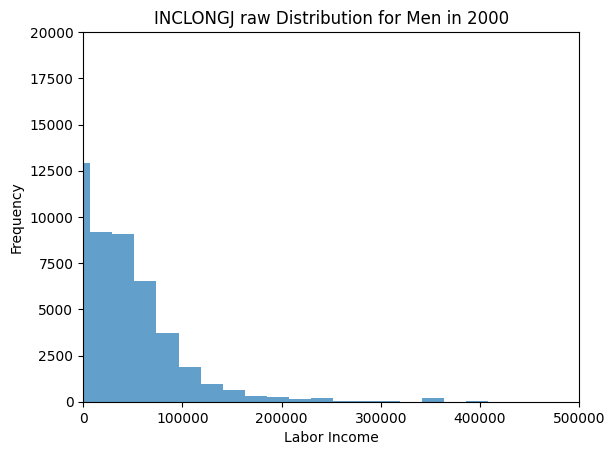

In [87]:
# INCWAGE- made up of df['INCLONGJ'] + df['OINCWAGE']
subset = df_2000[(df_2000['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['INCLONGJ_new'], bins=50, alpha=0.7)
plt.title(f'INCLONGJ raw Distribution for Men in 2000')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.xlim(0, 500000)
plt.ylim(0, 20000) 
plt.show()

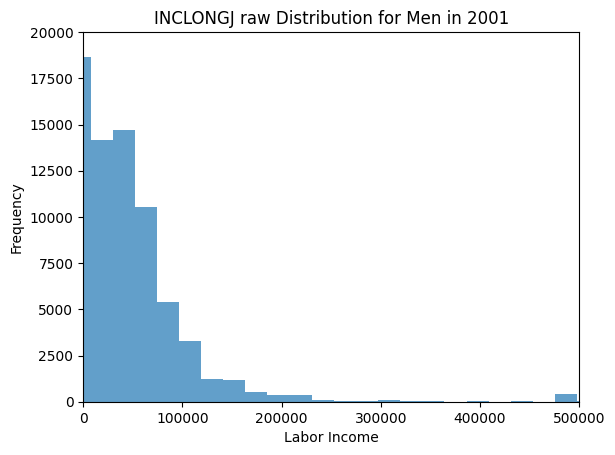

In [88]:
subset = df_2001[(df_2001['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['INCLONGJ_new'], bins=50, alpha=0.7)
plt.title(f'INCLONGJ raw Distribution for Men in 2001')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.xlim(0, 500000)
plt.ylim(0, 20000) 
plt.show()

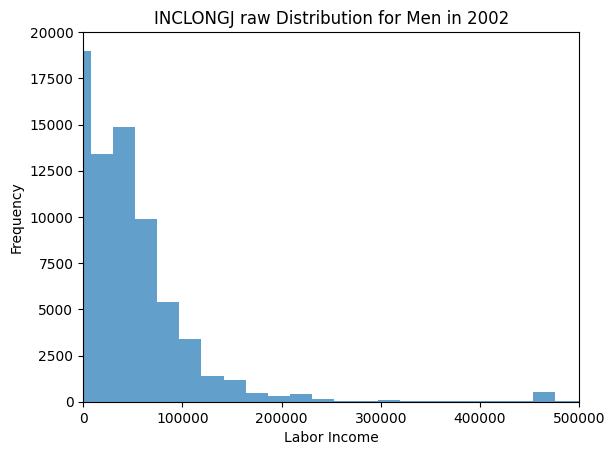

In [89]:
subset = df_2002[(df_2002['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['INCLONGJ_new'], bins=50, alpha=0.7)
plt.title(f'INCLONGJ raw Distribution for Men in 2002')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.xlim(0, 500000)
plt.ylim(0, 20000) 
plt.show()

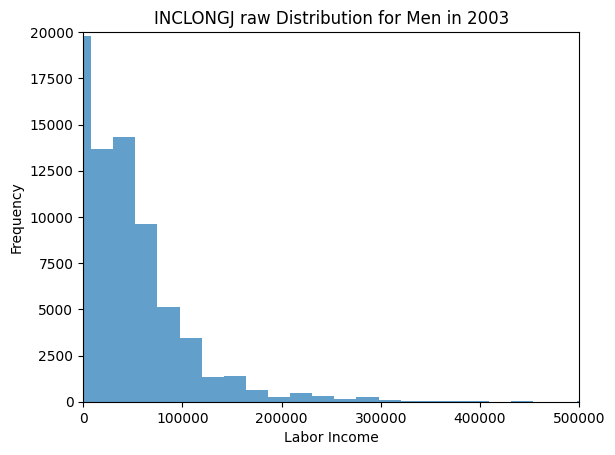

In [90]:
subset = df_2003[(df_2003['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['INCLONGJ_new'], bins=50, alpha=0.7)
plt.title(f'INCLONGJ raw Distribution for Men in 2003')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.xlim(0, 500000)
plt.ylim(0, 20000) 
plt.show()

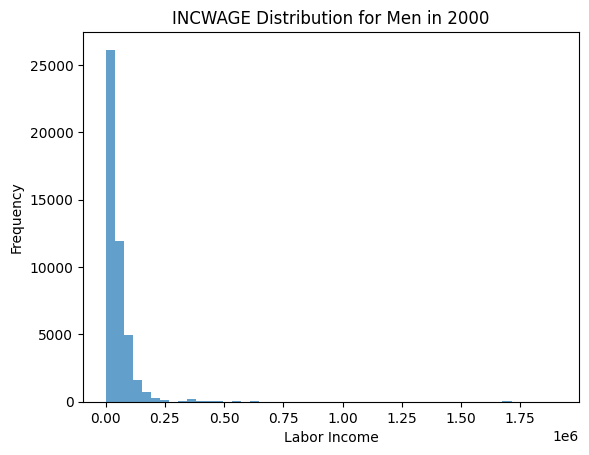

In [59]:
# INCWAGE- made up of df['INCLONGJ'] + df['OINCWAGE']

fig, axes = plt.subplots(2, 3, figsize=(15, 10))  # 2 rows, 3 columns for subplots
dfs = [df_2001, df_2002, df_2003, df_2004)
axes = axes.flatten()  # Flatten the axes array for easier indexing

for i, df in enumerate(dfs):
    # Subset the data for the specific year and men only
    subset = subset[subset['SEX'] == 1]
    
    # Plot the distribution on the respective axis
    axes[i].hist(subset['INCWAGE'], bins=50, alpha=0.7)
    axes[i].set_title(f'INCWAGE Distribution for Men in {year}')
    axes[i].set_xlabel('Labor Income')
    axes[i].set_ylabel('Frequency')

# Adjust layout and hide the last unused subplot if needed
fig.tight_layout()
plt.show()

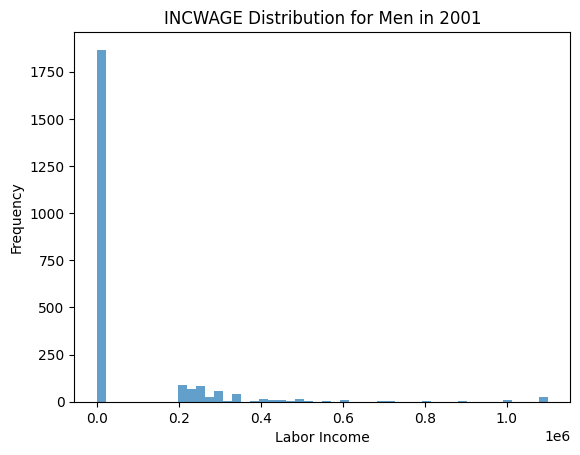

In [33]:
subset = df_2001[(df_2001['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['INCWAGE'], bins=50, alpha=0.7)
plt.title(f'INCWAGE Distribution for Men in 2001')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

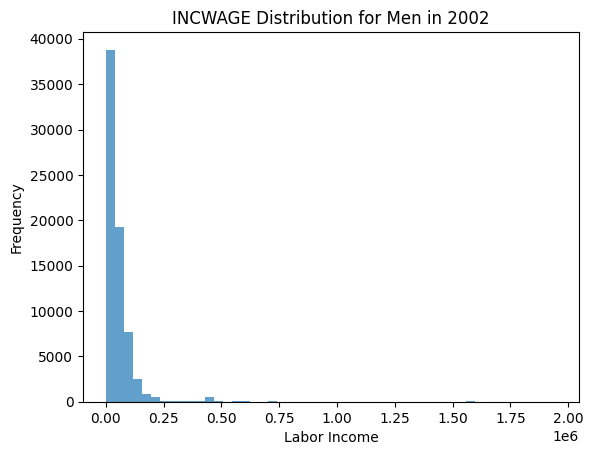

In [61]:
subset = df_2002[(df_2002['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['INCWAGE'], bins=50, alpha=0.7)
plt.title(f'INCWAGE Distribution for Men in 2002')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

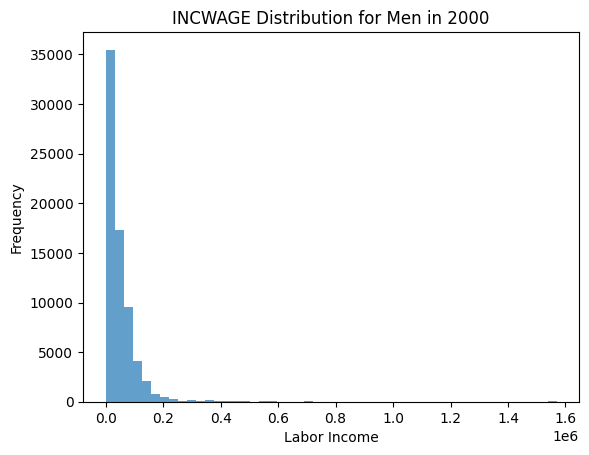

In [62]:
subset = df_2003[(df_2003['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['INCWAGE'], bins=50, alpha=0.7)
plt.title(f'INCWAGE Distribution for Men in 2000')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

In [63]:
# df['INCLONGJ']

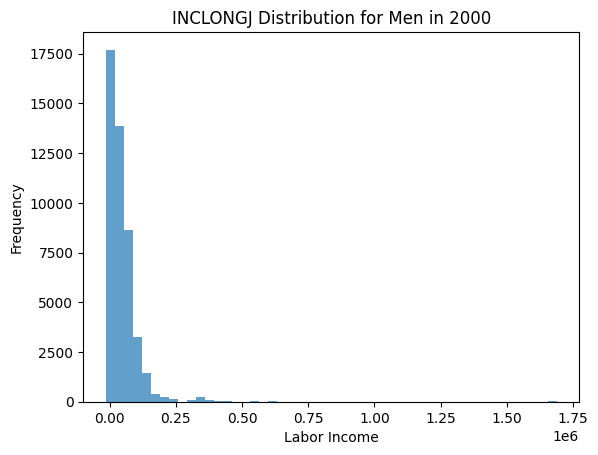

In [64]:
subset = df_2000[(df_2000['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['INCLONGJ'], bins=50, alpha=0.7)
plt.title(f'INCLONGJ Distribution for Men in 2000')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

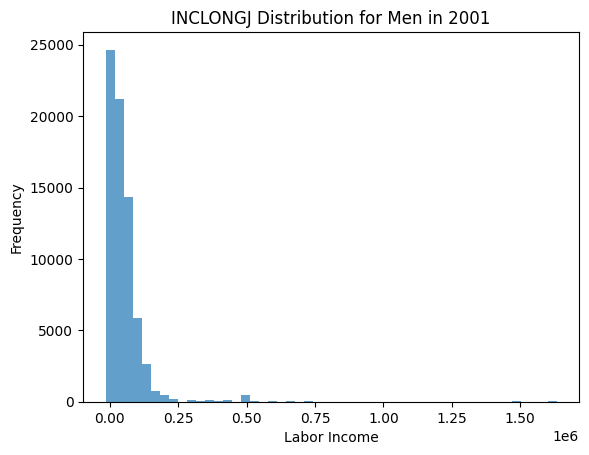

In [65]:
subset = df_2001[(df_2001['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['INCLONGJ'], bins=50, alpha=0.7)
plt.title(f'INCLONGJ Distribution for Men in 2001')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

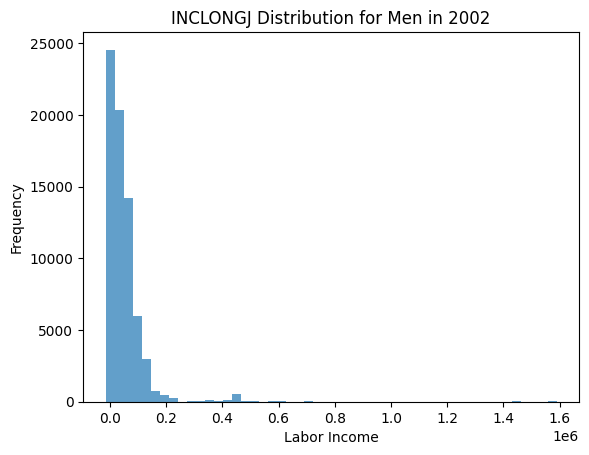

In [66]:
subset = df_2002[(df_2002['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['INCLONGJ'], bins=50, alpha=0.7)
plt.title(f'INCLONGJ Distribution for Men in 2002')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

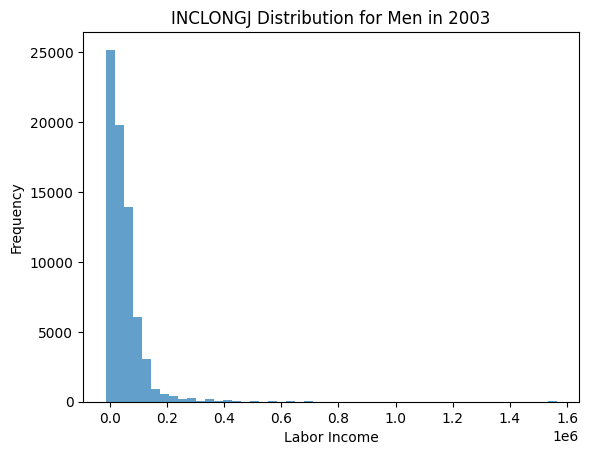

In [67]:
subset = df_2003[(df_2003['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['INCLONGJ'], bins=50, alpha=0.7)
plt.title(f'INCLONGJ Distribution for Men in 2003')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

In [34]:
merged

,YEAR,SERIAL,MONTH,CPSID,ASECFLAG,HFLAG,ASECWTH,CPI99,REGION,STATEFIP,...,OINCBUS_SWAP_y,OINCFARM_SWAP_y,INCCHILD_SWAP_y,INCDISA1_SWAP_y,INCDISA2_SWAP_y,INCRETI1_SWAP_y,INCRETI2_SWAP_y,INCSURV1_SWAP_y,INCSURV2_SWAP_y,INCLONGJ_SWAP_y
0,2000,2,3,19981202520100,1,NaN,974.38,1.0,11,23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2000,3,3,20000103263800,1,NaN,809.33,1.0,11,23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2000,3,3,20000103263800,1,NaN,809.33,1.0,11,23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2000,4,3,20000102304500,1,NaN,946.16,1.0,11,23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2000,5,3,20000103309500,1,NaN,877.98,1.0,11,23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97212,2000,64940,3,19981205976100,1,NaN,803.70,1.0,42,15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
97213,2000,64940,3,19981205976100,1,NaN,803.70,1.0,42,15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
97214,2000,64940,3,19981205976100,1,NaN,803.70,1.0,42,15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
97215,2000,64944,3,20000301557000,1,NaN,959.00,1.0,42,15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


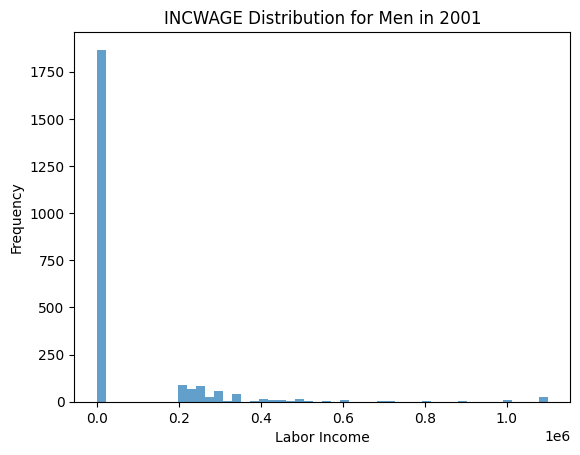

In [36]:
# Plot the distribution
plt.hist(merged['INCLONGJ_SWAP_y'], bins=50, alpha=0.7)
plt.title(f'INCWAGE Distribution for Men in 2001')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

In [68]:
# INCLONGJ SWAP

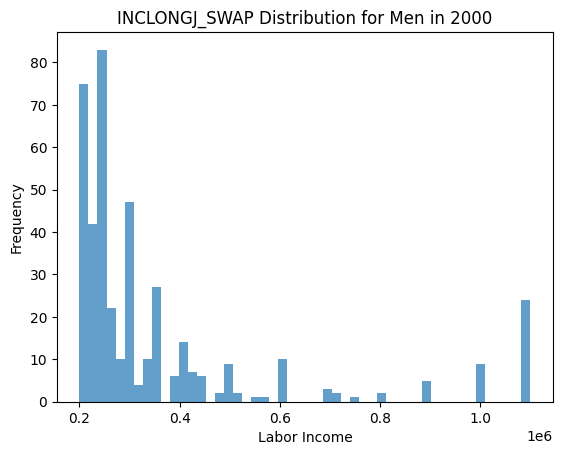

In [69]:
subset = df_2000[(df_2000['SEX'] == 1) & (df_2000['INCLONGJ_SWAP'] > 0)]

# Plot the distribution
plt.hist(subset['INCLONGJ_SWAP'], bins=50, alpha=0.7)
plt.title(f'INCLONGJ_SWAP Distribution for Men in 2000')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

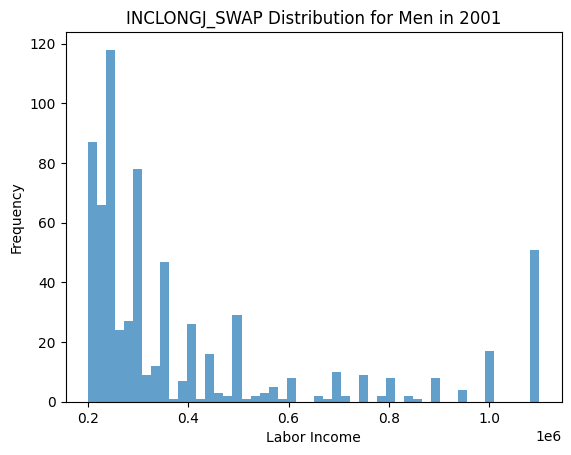

In [70]:
subset = df_2001[(df_2001['SEX'] == 1) & (df_2001['INCLONGJ_SWAP'] > 0)]

# Plot the distribution
plt.hist(subset['INCLONGJ_SWAP'], bins=50, alpha=0.7)
plt.title(f'INCLONGJ_SWAP Distribution for Men in 2001')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

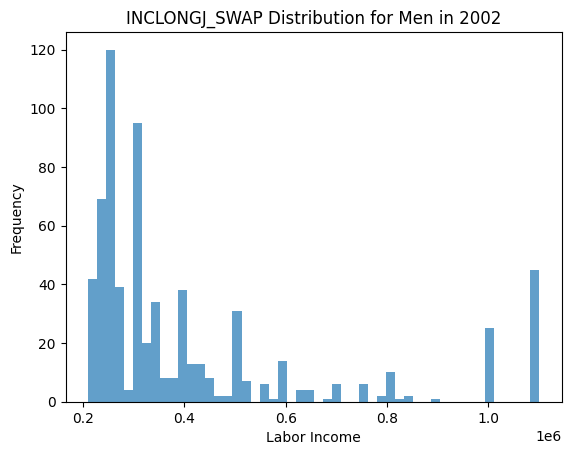

In [71]:
subset = df_2002[(df_2002['SEX'] == 1) & (df_2002['INCLONGJ_SWAP'] > 0)]

# Plot the distribution
plt.hist(subset['INCLONGJ_SWAP'], bins=50, alpha=0.7)
plt.title(f'INCLONGJ_SWAP Distribution for Men in 2002')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

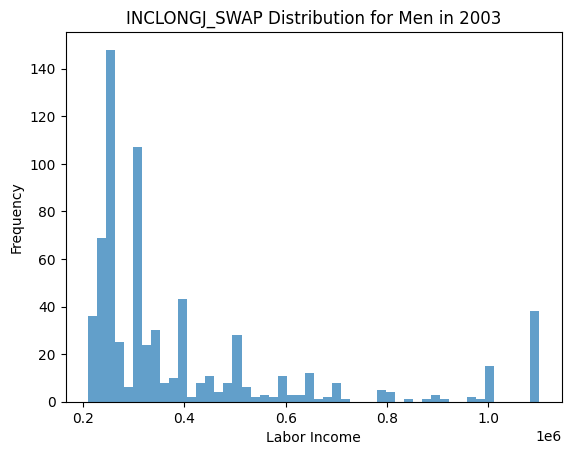

In [72]:
subset = df_2003[(df_2003['SEX'] == 1) & (df_2003['INCLONGJ_SWAP'] > 0)]

# Plot the distribution
plt.hist(subset['INCLONGJ_SWAP'], bins=50, alpha=0.7)
plt.title(f'INCLONGJ_SWAP Distribution for Men in 2003')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

In [ ]:
# df['OINCWAGE']

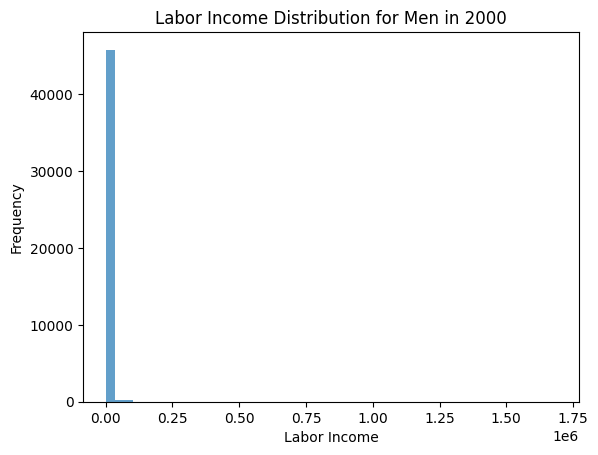

In [23]:
subset = df_2000[(df_2000['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['OINCWAGE'], bins=50, alpha=0.7)
plt.title(f'OINCWAGE Distribution for Men in 2000')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

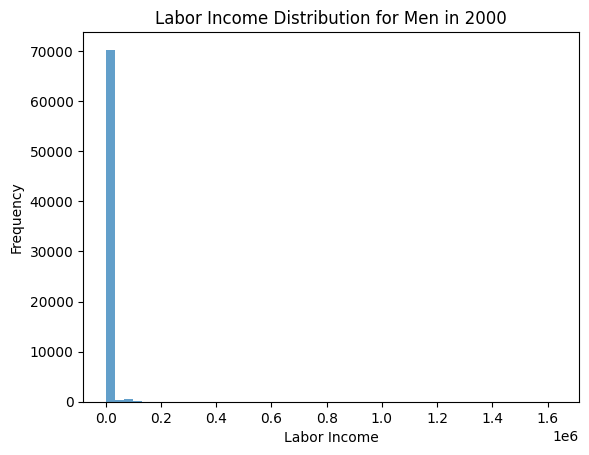

In [24]:
subset = df_2001[(df_2001['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['OINCWAGE'], bins=50, alpha=0.7)
plt.title(f'OINCWAGE Distribution for Men in 2000')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

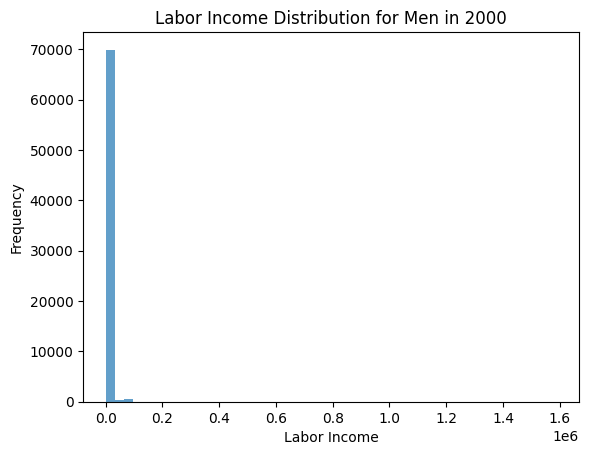

In [25]:
subset = df_2002[(df_2002['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['OINCWAGE'], bins=50, alpha=0.7)
plt.title(f'OINCWAGE Distribution for Men in 2000')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

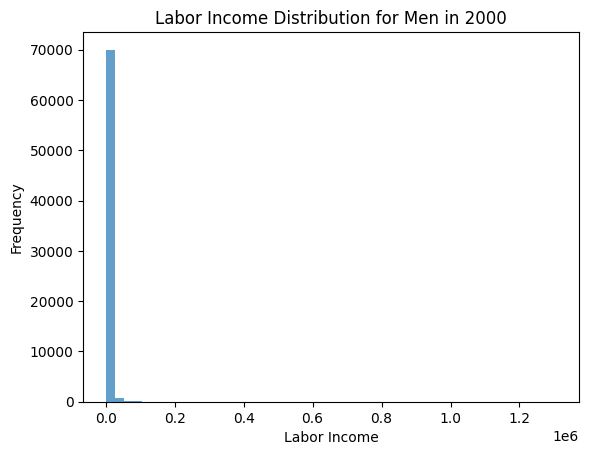

In [26]:
subset = df_2003[(df_2003['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['OINCWAGE'], bins=50, alpha=0.7)
plt.title(f'OINCWAGE Distribution for Men in 2000')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

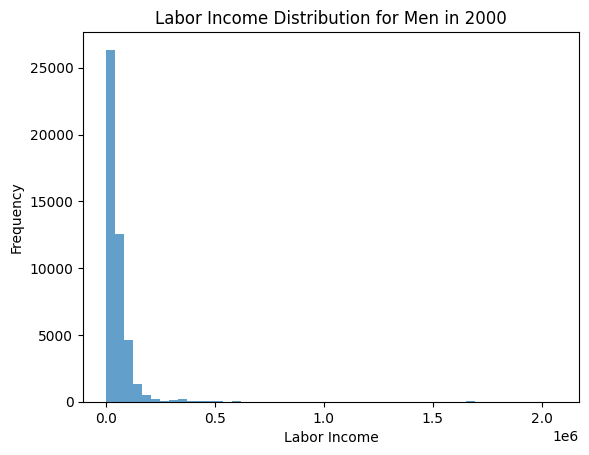

In [11]:
subset = df_2000[(df_2000['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['labor_income'], bins=50, alpha=0.7)
plt.title(f'Labor Income Distribution for Men in 2000')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

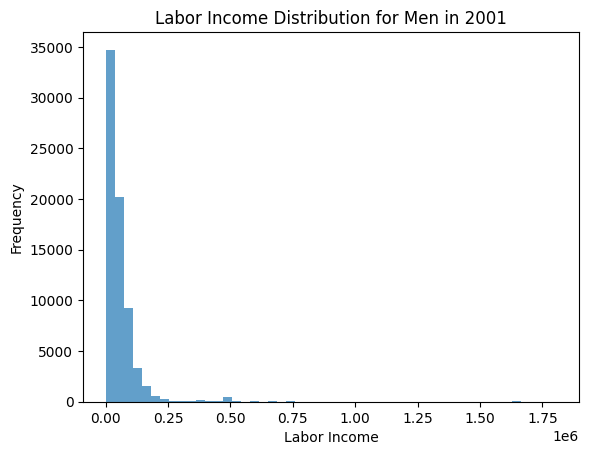

In [12]:
subset = df_2001[(df_2001['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['labor_income'], bins=50, alpha=0.7)
plt.title(f'Labor Income Distribution for Men in 2001')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

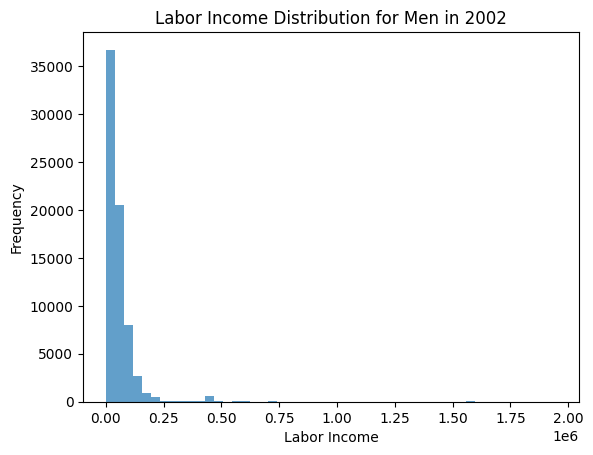

In [13]:
subset = df_2002[(df_2002['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['labor_income'], bins=50, alpha=0.7)
plt.title(f'Labor Income Distribution for Men in 2002')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

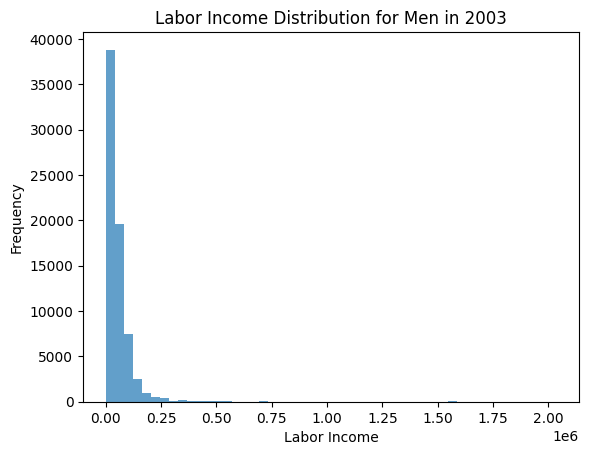

In [14]:
subset = df_2003[(df_2003['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['labor_income'], bins=50, alpha=0.7)
plt.title(f'Labor Income Distribution for Men in 2003')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

In [5]:
subset = df_2001_2[(df_2001_2['SEX'] == 1)]

# Plot the distribution
plt.hist(subset['labor_income'], bins=50, alpha=0.7)
plt.title(f'Labor Income Distribution for Men in 2001')
plt.xlabel('Labor Income')
plt.ylabel('Frequency')
plt.show()

NameError: name 'df_2001_2' is not defined

In [3]:
df_2000.loc[df_2000['winsor99'], 'labor_income'].max()

352035.365

In [4]:
df_2001.loc[df_2001['winsor99'], 'labor_income'].max()

489830.88131

In [5]:
df_2004.loc[df_2004['winsor99'], 'labor_income'].max()

294167.53047500004

In [6]:
df_2000['labor_income'].max()

2067838.41

In [7]:
df_2001['labor_income'].max()

1806593.33081

In [8]:
df_2004['labor_income'].max()

1751255.1287

In [9]:
df_2001['log_labor_income'].max()

14.406953492121266

In [10]:
df_2001.loc[df_2001['winsor99'], 'labor_income'].max()

489830.88131

In [22]:
print("YEAR: 2000")
for sex in df_2000['SEX'].unique():
    subset = df_2000[df_2000['SEX'] == sex]
    print(f"\nSEX {sex}:")
    print(f"99th percentile threshold: {subset['labor_income_99'].iloc[0]}")
    print(f"Max labor income: {subset['labor_income'].max()}")


SEX 2:
99th percentile threshold: 132410.51220000148
Max labor income: 1688498.465

SEX 1:
99th percentile threshold: 352035.365
Max labor income: 2067838.41


In [23]:
print("YEAR: 2001")
for sex in df_2001['SEX'].unique():
    subset = df_2001[df_2001['SEX'] == sex]
    print(f"\nSEX {sex}:")
    print(f"99th percentile threshold: {subset['labor_income_99'].iloc[0]}")
    print(f"Max labor income: {subset['labor_income'].max()}")

YEAR: 2001

SEX 1:
99th percentile threshold: 489830.88131
Max labor income: 1806593.33081

SEX 2:
99th percentile threshold: 133591.05
Max labor income: 1632778.015655


In [24]:
print("YEAR: 2004")
for sex in df_2004['SEX'].unique():
    subset = df_2004[df_2004['SEX'] == sex]
    print(f"\nSEX {sex}:")
    print(f"99th percentile threshold: {subset['labor_income_99'].iloc[0]}")
    print(f"Max labor income: {subset['labor_income'].max()}")

YEAR: 2004

SEX 2:
99th percentile threshold: 141695.85
Max labor income: 1528091.110825

SEX 1:
99th percentile threshold: 294167.53047500004
Max labor income: 1751255.1287


In [9]:
stats_data

{'1978': {'std_log_labor': 0.5340184329996234,
  'std_log_total': 0.5496482182307706,
  'var_log_labor': 0.2851756867833733,
  'var_log_total': 0.3021131638042608,
  'mean_log_labor': 10.903161690399411,
  'mean_log_total': 10.935910575965487,
  'unweighted_std_log_labor': 0.5354071351996206,
  'unweighted_std_log_total': 0.5514329857703045,
  'unweighted_var_log_labor': 0.2866608004226648,
  'unweighted_var_log_total': 0.3040783377955528,
  'unweighted_mean_log_labor': 10.898172763334193,
  'unweighted_mean_log_total': 10.9315985831032,
  'min_log_labor': 9.040670049764351,
  'median_log_labor': 10.912472226665942,
  'max_log_labor': 12.425060313110126,
  'min_log_total': 9.040670049764351,
  'median_log_total': 10.95608417112801,
  'max_log_total': 12.943146829473342,
  'men_std_log_labor': 0.5000806657316598,
  'men_std_log_total': 0.5150998601701876,
  'men_var_log_labor': 0.25008067223862007,
  'men_var_log_total': 0.2653278659473468,
  'men_mean_log_labor': 11.048354242865422,
  

In [6]:
# PLOT STD LABOR + CAP INCOME- meant to match fig 1 of Hoffman
# Convert to DataFrame
df = pd.DataFrame(stats_data).T

# Convert index to datetime for easier plotting
df.index = pd.to_datetime(df.index, format='%Y')
df.sort_index(inplace=True)

In [7]:
df = df.dropna(axis=1)
df

,std_log_labor,std_log_total,var_log_labor,var_log_total,mean_log_labor,mean_log_total,unweighted_std_log_labor,unweighted_std_log_total,unweighted_var_log_labor,unweighted_var_log_total,...,unweighted_women_var_log_labor,unweighted_women_var_log_total,unweighted_women_mean_log_labor,unweighted_women_mean_log_total,women_min_log_labor,women_max_log_labor,women_min_log_total,women_max_log_total,women_median_log_labor,women_median_log_total
1976-01-01,0.523735,0.539660,0.274298,0.291233,10.890380,10.923097,0.524018,0.539916,0.274595,0.291509,...,0.176379,0.187618,10.505668,10.527318,9.050610,11.482254,9.050610,11.982151,10.533582,10.546161
1977-01-01,0.524347,0.541772,0.274939,0.293517,10.904676,10.938773,0.527007,0.544254,0.277736,0.296212,...,0.176987,0.188548,10.518804,10.541498,9.046653,11.501648,9.046653,12.000249,10.535020,10.550671
1978-01-01,0.534018,0.549648,0.285176,0.302113,10.903162,10.935911,0.535407,0.551433,0.286661,0.304078,...,0.181771,0.191540,10.518827,10.540580,9.040670,11.566399,9.040670,12.064231,10.544747,10.544747
1979-01-01,0.534126,0.545885,0.285290,0.297991,10.906688,10.940311,0.535035,0.546828,0.286263,0.299021,...,0.176117,0.189113,10.528662,10.560886,9.023393,11.588524,9.023393,12.071451,10.556720,10.576923
1980-01-01,0.535444,0.545209,0.286701,0.297253,10.883726,10.920149,0.536543,0.546310,0.287878,0.298455,...,0.180426,0.192574,10.512826,10.555261,8.999928,11.568216,9.042487,12.137280,10.508824,10.563684
1981-01-01,0.528856,0.539230,0.279689,0.290769,10.840839,10.879446,0.531152,0.541663,0.282122,0.293399,...,0.181215,0.196293,10.492285,10.538663,9.033625,11.566733,9.033625,12.208647,10.525279,10.531433
1982-01-01,0.532709,0.543567,0.283779,0.295465,10.815271,10.856007,0.535028,0.545548,0.286255,0.297622,...,0.182434,0.197830,10.475978,10.523032,9.040852,11.483199,9.040852,12.102556,10.479897,10.518254
1983-01-01,0.542700,0.555609,0.294523,0.308701,10.817676,10.860062,0.543010,0.555788,0.294860,0.308900,...,0.191600,0.207788,10.499689,10.545498,8.980705,11.570972,9.076015,12.130196,10.521150,10.556241
1984-01-01,0.543380,0.557119,0.295262,0.310382,10.827288,10.869276,0.544839,0.557721,0.296849,0.311053,...,0.199185,0.214304,10.528205,10.573109,9.044827,11.657567,9.058371,12.223893,10.558954,10.572200
1985-01-01,0.574017,0.589218,0.329495,0.347178,10.851626,10.898790,0.573277,0.587938,0.328646,0.345671,...,0.201447,0.217908,10.538854,10.589544,9.037803,11.679364,9.037803,12.225178,10.543568,10.584808


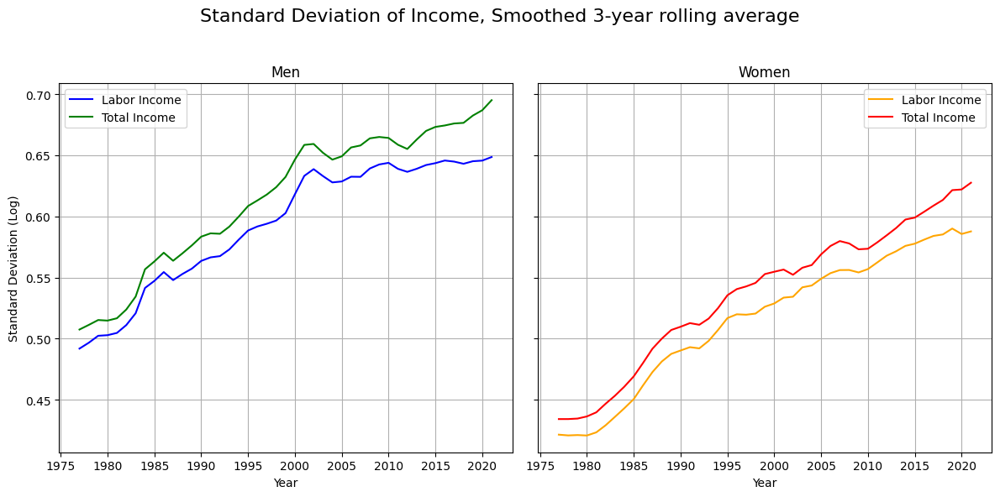

In [8]:
# Calculate 3-year moving average
# df_ma = df
df_ma = df.rolling(window=3, center=True).mean()
df_ma = df_ma.dropna(axis=0)


# Plot side-by-side subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)

# Men subplot
axes[0].plot(df_ma.index, df_ma['men_std_log_labor'], label='Labor Income', color='blue')
axes[0].plot(df_ma.index, df_ma['men_std_log_total'], label='Total Income', color='green')
axes[0].set_title('Men')
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Standard Deviation (Log)')
axes[0].legend()
axes[0].grid(True)

# Women subplot
axes[1].plot(df_ma.index, df_ma['women_std_log_labor'], label='Labor Income', color='orange')
axes[1].plot(df_ma.index, df_ma['women_std_log_total'], label='Total Income', color='red')
axes[1].set_title('Women')
axes[1].set_xlabel('Year')
axes[1].legend()
axes[1].grid(True)

# Adjust layout
plt.suptitle('Standard Deviation of Income, Smoothed 3-year rolling average', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()
# something around 2000-2005 is different
# print min and max graphs too
# then check through idk to see why?


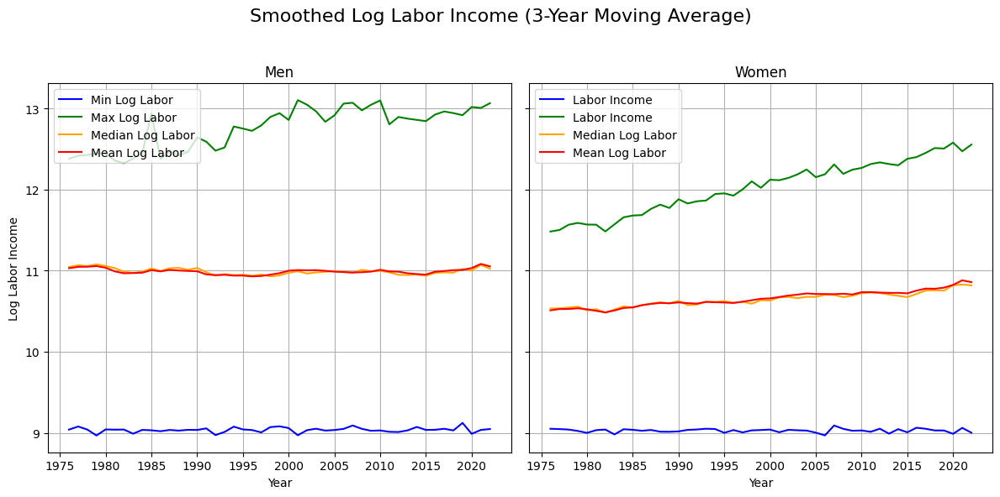

In [37]:
# Calculate 3-year moving average
df_ma = df
# df_ma = df.rolling(window=3, center=True).mean()
# df_ma = df_ma.dropna(axis=0)


# Plot side-by-side subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)

# Men subplot
axes[0].plot(df_ma.index, df_ma['men_min_log_labor'], label='Min Log Labor', color='blue')
axes[0].plot(df_ma.index, df_ma['men_max_log_labor'], label='Max Log Labor', color='green')
axes[0].plot(df_ma.index, df_ma['men_median_log_labor'], label='Median Log Labor', color='orange')
axes[0].plot(df_ma.index, df_ma['men_mean_log_labor'], label='Mean Log Labor', color='red')
axes[0].set_title('Men')
axes[0].set_xlabel('Year')
axes[0].set_ylabel('Log Labor Income')
axes[0].legend()
axes[0].grid(True)

# Women subplot
axes[1].plot(df_ma.index, df_ma['women_min_log_labor'], label='Labor Income', color='blue')
axes[1].plot(df_ma.index, df_ma['women_max_log_labor'], label='Labor Income', color='green')
axes[1].plot(df_ma.index, df_ma['women_median_log_labor'], label='Median Log Labor', color='orange')
axes[1].plot(df_ma.index, df_ma['women_mean_log_labor'], label='Mean Log Labor', color='red')
# axes[1].plot(df_ma.index, df_ma['women_std_log_labor'], label='Labor Income', color='orange')
# axes[1].plot(df_ma.index, df_ma['women_std_log_total'], label='Total Income', color='red')
axes[1].set_title('Women')
axes[1].set_xlabel('Year')
axes[1].legend()
axes[1].grid(True)

# Adjust layout
plt.suptitle('Smoothed Log Labor Income (3-Year Moving Average)', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()
# something around 2000-20005 is different
# print min and max graphs too
# then check through idk to see why?


In [58]:
def plot_variances(df):
    # Extract the year from the index (assuming the index is a datetime object)
    df['Year'] = df.index.year  # Get the year from the datetime index

    # Create a 5-year grouping
    df['5_year_group'] = (df['Year'] // 5) * 5

    # Group by 5-year period and compute the mean variance for each group
    grouped = df.groupby('5_year_group').agg({
        'men_var_log_labor': 'mean',
        'men_var_log_total': 'mean',
        'women_var_log_labor': 'mean',
        'women_var_log_total': 'mean'
    }).reset_index()

    bar_width = 0.35
    x = np.arange(len(grouped['5_year_group']))
    
    # Creating the year ranges for the x-axis labels
    year_ranges = [f"{start}-{start + 4}" for start in grouped['5_year_group']]

    # Create plots
    fig, axes = plt.subplots(2, 1, figsize=(10, 12), sharex=True)

    # Stacked bar chart for men
    axes[0].bar(x, grouped['men_var_log_labor'], bar_width, label='Men: Log Labor Income')
    axes[0].bar(x, grouped['men_var_log_total'] - grouped['men_var_log_labor'], bar_width,
                bottom=grouped['men_var_log_labor'], label='Men: Log Capital Income', color='orange')
    axes[0].set_ylabel('Log Income')
    axes[0].set_title('Men Log Income by 5-Year Group')
    axes[0].set_xticks(x)
    axes[0].set_xticklabels(year_ranges)
    axes[0].legend()
    axes[0].grid(axis='y', linestyle='--', alpha=0.7)
    axes[0].set_yticks(np.arange(0, 0.5, 0.05))  # Set y-ticks every 0.05

    # Stacked bar chart for women
    axes[1].bar(x, grouped['women_var_log_labor'], bar_width, label='Women: Log Labor Income')
    axes[1].bar(x, grouped['women_var_log_total'] - grouped['women_var_log_labor'], bar_width,
                bottom=grouped['women_var_log_labor'], label='Women: Log Capital Income', color='orange')
    axes[1].set_xlabel('5-Year Interval')
    axes[1].set_ylabel('Log Income')
    axes[1].set_title('Women Log Income by 5-Year Group')
    axes[1].set_xticks(x)
    axes[1].set_xticklabels(year_ranges)
    axes[1].legend()
    axes[1].grid(axis='y', linestyle='--', alpha=0.7)
    axes[1].set_yticks(np.arange(0, 0.5, 0.05))  # Set y-ticks every 0.05

    plt.tight_layout()
    plt.show()


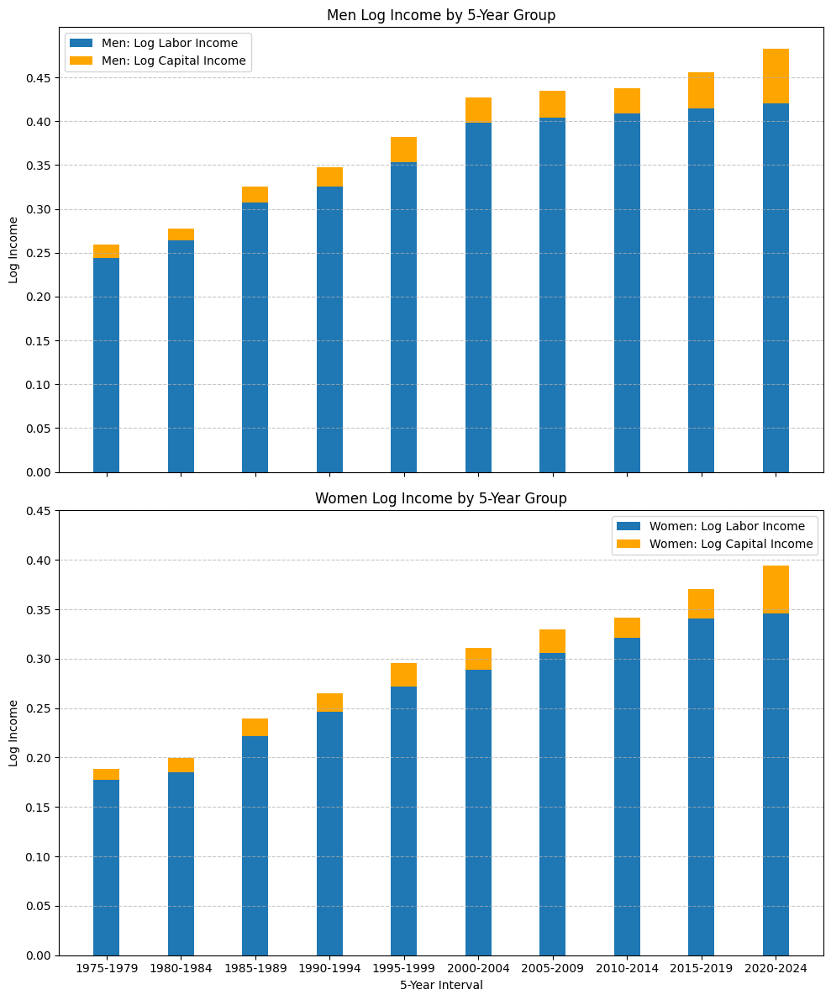

In [59]:
plot_variances(df)

In [ ]:
# GINI VISUALIZATIONS

In [11]:
df = pd.DataFrame.from_dict(gini_data, orient='index')
df.reset_index(inplace=True)
df.rename(columns={'index': 'year'}, inplace=True)
df['year'] = df['year'].astype(int)
df = df.sort_values('year')
df

,year,exploitation,patronage,exclusion,rationing,total
0,1976,0.000333,0.000153,0.297461,0.106267,0.404213
1,1977,0.000279,0.000118,0.310543,0.113055,0.423995
2,1978,0.000264,0.000111,0.310546,0.114320,0.425241
3,1979,0.000295,0.000163,0.331483,0.161642,0.493583
6,1980,0.000297,0.000208,0.356359,0.208064,0.564928
7,1981,0.000304,0.000192,0.354218,0.205563,0.560278
4,1982,0.000298,0.000186,0.352355,0.207246,0.560085
10,1983,0.000321,0.000201,0.362746,0.208234,0.571502
9,1984,0.000304,0.000188,0.367263,0.206320,0.574075
8,1985,0.000299,0.000185,0.365130,0.205334,0.570948


In [15]:
df = df[df['year'] >= 1994]

In [17]:
# Calculate percentage contributions
df['exploitation_percent'] = (df['exploitation'] / df['total']) * 100
df['exclusion_percent'] = (df['exclusion'] / df['total']) * 100
df['patronage_percent'] = (df['patronage'] / df['total']) * 100
df['rationing_percent'] = (df['rationing'] / df['total']) * 100

# # Reset index to have 'year' as a column
# df.reset_index(inplace=True)

/var/folders/lm/19nvcr8165sg016zr309_t000000gn/T/ipykernel_1203/4089257071.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['exploitation_percent'] = (df['exploitation'] / df['total']) * 100
/var/folders/lm/19nvcr8165sg016zr309_t000000gn/T/ipykernel_1203/4089257071.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['exclusion_percent'] = (df['exclusion'] / df['total']) * 100
/var/folders/lm/19nvcr8165sg016zr309_t000000gn/T/ipykernel_1203/4089257071.py:4: SettingWithCopyWarning: 
A value is trying 

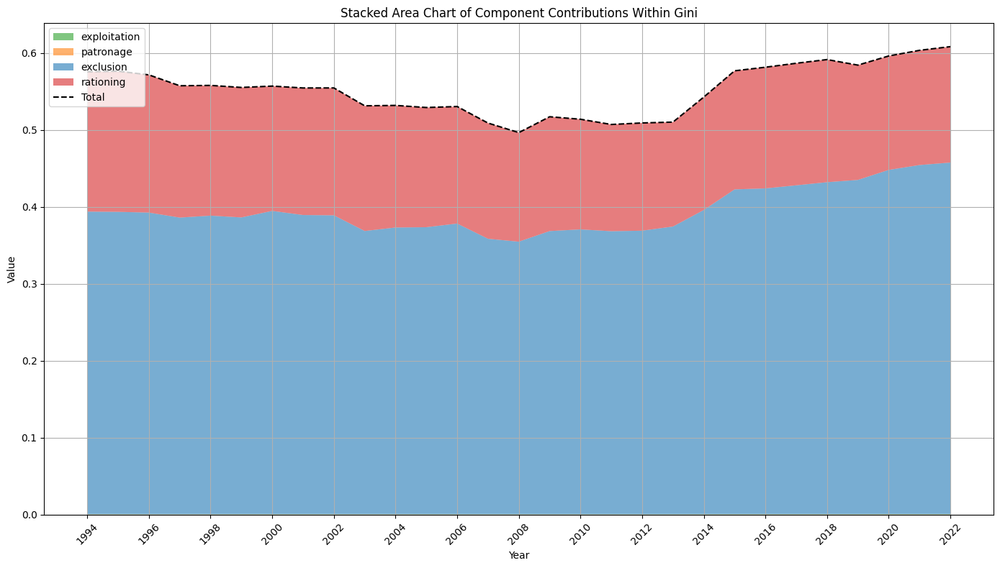

In [18]:
components = ['exploitation', 'patronage', 'exclusion', 'rationing']
colors = ['#2ca02c', '#ff7f0e', '#1f77b4', '#d62728', '#9467bd']  # Blue, Orange, Green, Red


# Create the stacked area chart
plt.figure(figsize=(14, 8))
plt.stackplot(df['year'], 
              df[components].T, 
              labels=components,
              colors=colors,
              alpha=0.6)

# Plot the total value as a line
plt.plot(df['year'], df['total'], color='black', linestyle='--', label='Total')

# Formatting
plt.xlabel('Year')
plt.ylabel('Value')
plt.title('Stacked Area Chart of Component Contributions Within Gini')
plt.legend(loc='upper left')
plt.grid(True)

# Rotate the x-axis labels and adjust the layout
plt.xticks(df['year'][::2], rotation=45)
plt.tight_layout()
plt.show()

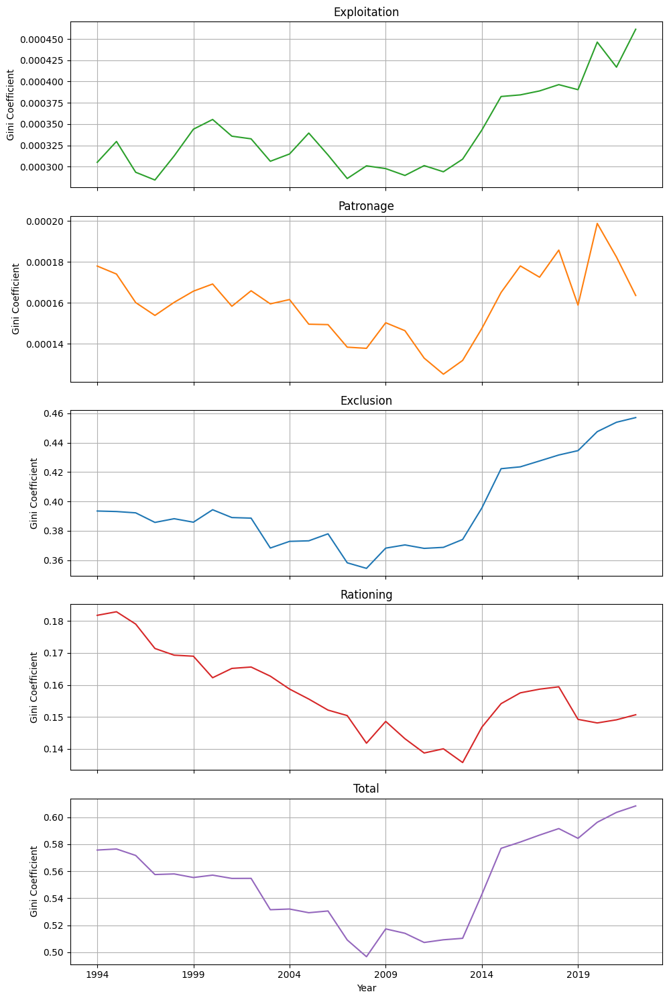

In [19]:
components = ['exploitation', 'patronage', 'exclusion', 'rationing', 'total']

# Plotting
fig, axs = plt.subplots(len(components), 1, figsize=(10, 15), sharex=True)

for i, component in enumerate(components):
    axs[i].plot(df['year'], df[component], label=f'Gini {component}', color=colors[i])
    axs[i].set_title(f'{component.capitalize()}')
    axs[i].set_ylabel('Gini Coefficient')
    # axs[i].set_ylim(0, 1)
    axs[i].grid(True)
    axs[i].set_xticks(df['year'][::5])

axs[-1].set_xlabel('Year')
plt.tight_layout()
plt.show()

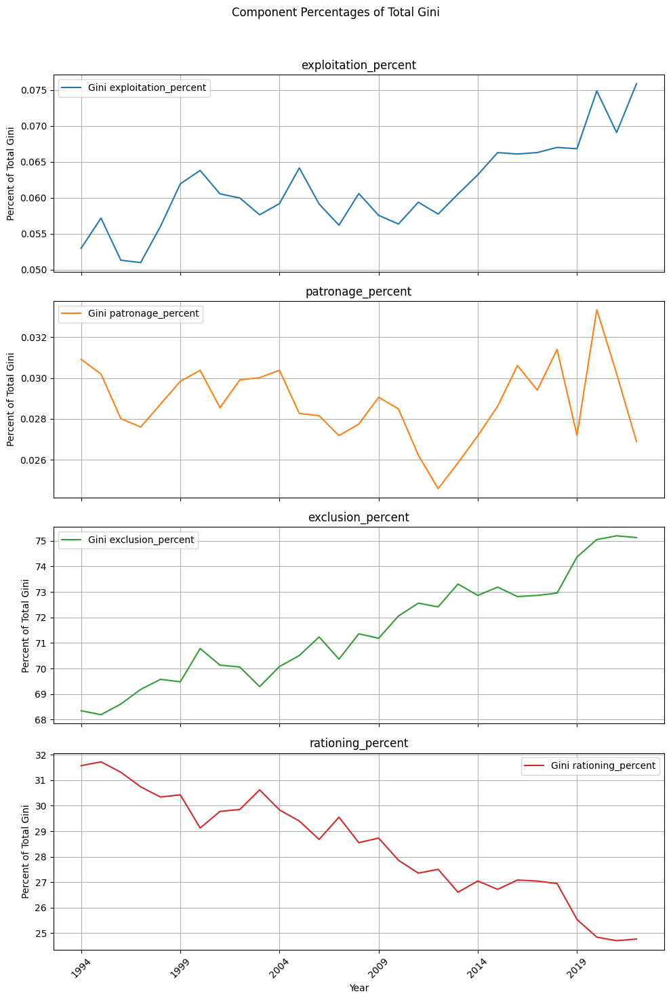

In [20]:
components = ['exploitation_percent', 'patronage_percent', 'exclusion_percent', 'rationing_percent']

# Plotting
fig, axs = plt.subplots(len(components), 1, figsize=(10, 15), sharex=True)
fig.suptitle('Component Percentages of Total Gini')

for i, component in enumerate(components):
    axs[i].plot(df['year'], df[component], label=f'Gini {component}', color=f'C{i}')
    axs[i].set_title(f'{component}')
    axs[i].set_ylabel('Percent of Total Gini')
    axs[i].grid(True)
    axs[i].legend()
    axs[i].set_xticks(df['year'][::5])
    axs[i].set_xticklabels(df['year'][::5], rotation=45)

axs[-1].set_xlabel('Year')
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to fit the title
plt.show()

In [ ]:
# Step 1: Load the CSV file into a pandas DataFrame
df = pd.read_csv('./data/cps_data/all_years.csv')

df = df[(df['AGE'] >= 18) & (df['winsor99']) & (df['YEAR'] >= 1977)]

# Step 2: Ensure the 'year' column is the index and sort the DataFrame by year
df['year'] = pd.to_datetime(df['YEAR'], format='%Y')
df.set_index('year', inplace=True)
df.sort_index(inplace=True)

# Step 3: Plot the time series for each variable
variables = ['labor_income', 'capital_income', 'INCDRT', 'INCINT', 'INCBUS', 'INCFARM', 'INCWAGE']  # replace with your actual variable names

# Step 3: Group by year and calculate the mean for each variable
df_mean = df.groupby('year').mean()
df_stats = df.groupby('YEAR').agg(['mean', 'std', 'min', 'max', 'median'])

/var/folders/lm/19nvcr8165sg016zr309_t000000gn/T/ipykernel_3867/1007237837.py:15: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_mean = df.groupby('year').mean()


In [ ]:
# Step 5: Plot each variable in a separate plot with mean, std deviation, min, and max
for variable in variables:
    plt.figure(figsize=(10, 6))
    
    # Mean
    plt.plot(df_stats.index, df_stats[(variable, 'mean')], marker='o', linestyle='-', label=f'{variable} mean')
    plt.plot(df_stats.index, df_stats[(variable, 'median')], marker='o', linestyle='-', label=f'{variable} median')
    
    # Standard Deviation
    plt.fill_between(df_stats.index, 
                     df_stats[(variable, 'mean')] - df_stats[(variable, 'std')], 
                     df_stats[(variable, 'mean')] + df_stats[(variable, 'std')],
                     color='gray', alpha=0.2, label=f'{variable} ± 1 std')
    
    # Min and Max
    plt.plot(df_stats.index, df_stats[(variable, 'min')], marker='x', linestyle='--', label=f'{variable} min', color='red')
    plt.plot(df_stats.index, df_stats[(variable, 'max')], marker='x', linestyle='--', label=f'{variable} max', color='green')
    
    # Formatting the plot
    plt.xlabel('Year')
    plt.ylabel('Values')
    plt.title(f'Time Series of {variable} by Year')
    plt.legend(loc='best')
    plt.grid(True)
    plt.tight_layout()
    
    # Show the plot
    plt.show()

In [ ]:
# Create a new column for the state x industry combination
df['stateXindustry'] = df['STATEFIP'].astype(str) + '-' + df['IND1950'].astype(str)

# Calculate the number of unique state x industry combinations per year
unique_combinations_per_year = df.groupby('YEAR')['stateXindustry'].nunique()

states_per_year = df.groupby('YEAR')['stateXindustry'].nunique()

# Calculate the number of rows per year
rows_per_year = df.groupby('YEAR').size()

# Calculate the median number of people per state x industry combination per year
median_people_per_combination_per_year = df.groupby(['YEAR', 'stateXindustry']).size().groupby('YEAR').median()

# Plotting the results
plt.figure(figsize=(14, 8))

# Plot unique combinations per year
plt.subplot(3, 1, 1)
plt.plot(unique_combinations_per_year.index, unique_combinations_per_year.values, marker='o', linestyle='-', color='b')
plt.xlabel('Year')
plt.ylabel('Number of Unique State x Industry Combinations')
plt.title('Unique State x Industry Combinations Per Year')
plt.grid(True)

# Plot rows per year
plt.subplot(3, 1, 2)
plt.plot(rows_per_year.index, rows_per_year.values, marker='o', linestyle='-', color='g')
plt.xlabel('Year')
plt.ylabel('Number of Rows')
plt.title('Number of Rows Per Year')
plt.grid(True)

# Plot median number of people per state x industry combination per year
plt.subplot(3, 1, 3)
plt.plot(median_people_per_combination_per_year.index, median_people_per_combination_per_year.values, marker='o', linestyle='-', color='r')
plt.xlabel('Year')
plt.ylabel('Median Number of People per State x Industry Combination')
plt.title('Median Number of People per State x Industry Combination Per Year')
plt.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
# stacked area chart
plt.figure(figsize=(12, 8))
plt.stackplot(df['year'], 
              df['exploitation_percent'], 
              df['exclusion_percent'], 
              df['patronage_percent'], 
              df['rationing_percent'], 
              labels=['Exploitation', 'Exclusion', 'Patronage', 'Rationing'])

plt.xlabel('Year')
plt.ylabel('Percentage of Total (%)')
plt.title('Stacked Area Chart of Component Contributions Over Time')
plt.legend(loc='upper left')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
# Line graph
plt.figure(figsize=(12, 8))

plt.plot(df['year'], df['exploitation_percent'], label='Exploitation', marker='o')
plt.plot(df['year'], df['exclusion_percent'], label='Exclusion', marker='o')
plt.plot(df['year'], df['patronage_percent'], label='Patronage', marker='o')
plt.plot(df['year'], df['rationing_percent'], label='Rationing', marker='o')

plt.xlabel('Year')
plt.ylabel('Percentage of Total (%)')
plt.title('Percentage of Total by Component Over Time')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

In [8]:
unprocessed_data = pd.read_csv('./data/cps_data/all_years.csv')

# Group by 'year' and count the number of unique 'IND' codes for each year
distinct_codes_per_year = unprocessed_data.groupby('income_year')['IND1950'].nunique()

# Plotting
plt.figure(figsize=(14, 8))
plt.plot(distinct_codes_per_year.index, distinct_codes_per_year.values, marker='o', linestyle='-')

# Formatting
plt.xlabel('Year')
plt.ylabel('Number of Distinct IND Codes')
plt.title('Number of Distinct IND Codes Per Year')
plt.grid(True)
plt.tight_layout()
plt.show()

KeyboardInterrupt: 

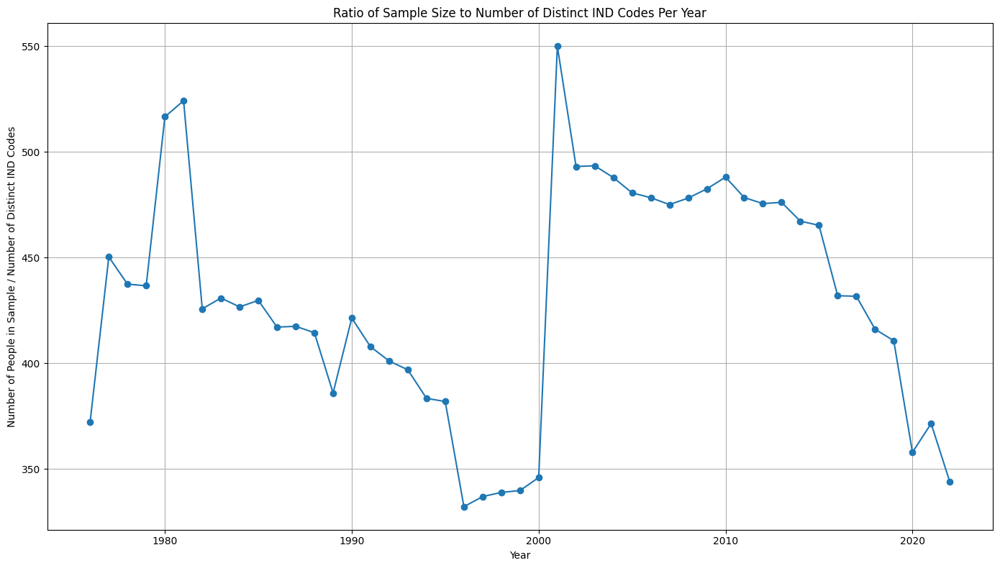

In [62]:
# Calculate the number of people per year
people_per_year = unprocessed_data.groupby('YEAR').size()

# Calculate the ratio of number of people per year to the number of distinct codes per year
ratio_per_year = people_per_year / distinct_codes_per_year

# Plotting
plt.figure(figsize=(14, 8))
plt.plot(ratio_per_year.index, ratio_per_year.values, marker='o', linestyle='-')

# Formatting
plt.xlabel('Year')
plt.ylabel('Number of People in Sample / Number of Distinct IND Codes')
plt.title('Ratio of Sample Size to Number of Distinct IND Codes Per Year')
plt.grid(True)
plt.tight_layout()
plt.show()

NameError: name 'json' is not defined